In [1]:
import os, glob, re, cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

from sklearn.model_selection import train_test_split

from tensorflow import keras
from tensorflow.keras import layers, activations, optimizers, losses, metrics, initializers
from tensorflow.keras.preprocessing import image, image_dataset_from_directory
from tensorflow.keras.applications.resnet_v2 import preprocess_input, decode_predictions




In [2]:
EPOCHS = 60


In [3]:
framObjTrain = {'img' : [],
           'mask' : []
          }


def LoadData( frameObj = None, imgPath = None, maskPath = None, shape = 256):
    
      
    imgNames = os.listdir(imgPath)

    names = []
    maskNames = []
    unames = [imgNames[i].split(')')[0] for i in range(len(imgNames))]
    unames = list(set(unames))

    
    for uname in unames:
        names.append(f'{uname}).png')
        maskNames.append(f'{uname})_mask.png')

    imgAddr = f'{imgPath}/'
    maskAddr = f'{maskPath}/'

    
    for i in range (len(names)):
        img = plt.imread(imgAddr + names[i])
        mask = plt.imread(maskAddr + maskNames[i])

        img = cv2.resize(img, (shape, shape)) 
        mask = cv2.resize(mask, (shape, shape))

        frameObj['img'].append(img)
        frameObj['mask'].append(mask)

    return frameObj


In [4]:
 
 
 


framObjTrain = LoadData( framObjTrain, imgPath = 'C:/Users/OFFICE/Documents/mp/Dataset_BUSI_with_GT/benign'
                        , maskPath = 'C:/Users/OFFICE/Documents/mp/Dataset_BUSI_with_GT/benign'
                        , shape = 256)



framObjTrain = LoadData( framObjTrain, imgPath = 'C:/Users/OFFICE/Documents/mp/Dataset_BUSI_with_GT/malignant'
                        , maskPath = 'C:/Users/OFFICE/Documents/mp/Dataset_BUSI_with_GT/malignant'
                        , shape = 256)


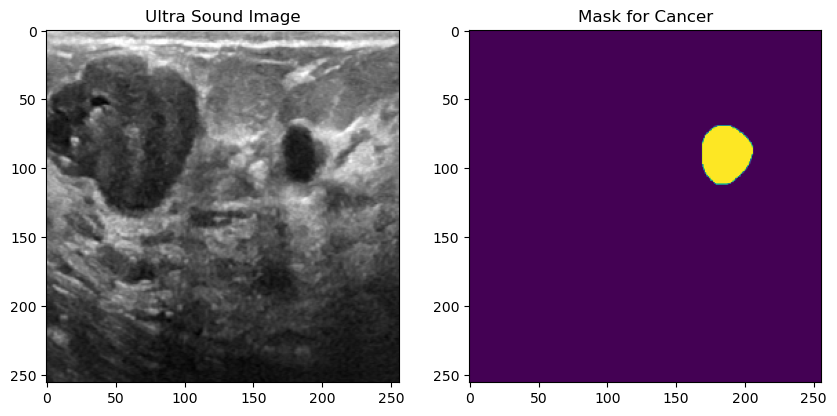

In [5]:

plt.figure(figsize = (10, 7))
plt.subplot(1,2,1)
plt.imshow(framObjTrain['img'][1])
plt.title('Ultra Sound Image')
plt.subplot(1,2,2)
plt.imshow(framObjTrain['mask'][1])
plt.title('Mask for Cancer')
plt.show()

In [6]:
 
def Conv2dBlock(inputTensor, numFilters, kernelSize = 3, doBatchNorm = True):
     
   
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (inputTensor)
    
    
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
        
    x =tf.keras.layers.Activation('relu')(x)
    
    
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (x)
    
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
        
    x = tf.keras.layers.Activation('relu')(x)
    
    return x


 
def GiveMeUnet(inputImage, numFilters = 16, droupouts = 0.1, doBatchNorm = True):
    
    
    c1 = Conv2dBlock(inputImage, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)
    p1 = tf.keras.layers.Dropout(droupouts)(p1)

    c2 = Conv2dBlock(p1, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)
    p2 = tf.keras.layers.Dropout(droupouts)(p2)

    c3 = Conv2dBlock(p2, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)
    p3 = tf.keras.layers.Dropout(droupouts)(p3)

    c4 = Conv2dBlock(p3, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)
    p4 = tf.keras.layers.Dropout(droupouts)(p4)

    c5 = Conv2dBlock(p4, numFilters * 16, kernelSize = 3, doBatchNorm = doBatchNorm)

    
    u6 = tf.keras.layers.Conv2DTranspose(numFilters*8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    u6 = tf.keras.layers.Dropout(droupouts)(u6)
    c6 = Conv2dBlock(u6, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)

    u7 = tf.keras.layers.Conv2DTranspose(numFilters*4, (3, 3), strides = (2, 2), padding = 'same')(c6)

    u7 = tf.keras.layers.concatenate([u7, c3])
    u7 = tf.keras.layers.Dropout(droupouts)(u7)
    c7 = Conv2dBlock(u7, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)

    u8 = tf.keras.layers.Conv2DTranspose(numFilters*2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    u8 = tf.keras.layers.Dropout(droupouts)(u8)
    c8 = Conv2dBlock(u8, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)

    u9 = tf.keras.layers.Conv2DTranspose(numFilters*1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    u9 = tf.keras.layers.Dropout(droupouts)(u9)
    c9 = Conv2dBlock(u9, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)

    output = tf.keras.layers.Conv2D(1, (1, 1), activation = 'sigmoid')(c9)
    return tf.keras.Model(inputs = [inputImage], outputs = [output])


In [7]:
from tensorflow.keras.utils import plot_model



height = 256
width = 256
channels = 3


inputImage = tf.keras.layers.Input(shape=(height, width, channels))
model = GiveMeUnet(inputImage)  


plot_model(model, to_file='model_plot_GiveUnet.png', show_shapes=True, show_layer_names=True)


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [8]:

inputs = tf.keras.layers.Input((256, 256, 3))
myTransformer = GiveMeUnet(inputs, droupouts= 0.07)
myTransformer.compile(optimizer = 'Adam', loss = 'binary_crossentropy', metrics = ['accuracy'] )


In [9]:
from tqdm import tqdm
from keras.callbacks import Callback
import matplotlib.pyplot as plt

class TQDMProgressBar(Callback):
    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']
        self.pbar = tqdm(total=self.epochs, desc="Training")

    def on_epoch_end(self, epoch, logs=None):
        self.pbar.update(1)

    def on_train_end(self, logs=None):
        self.pbar.close()


pbar_callback = TQDMProgressBar()


retVal = myTransformer.fit(np.array(framObjTrain['img']), np.array(framObjTrain['mask']),
                           epochs=EPOCHS, batch_size=8,
                           workers=4, use_multiprocessing=True,
                           callbacks=[pbar_callback],
                           verbose=0)


Training: 100%|█████████████████████████████████████████████████████████████████████| 60/60 [5:45:11<00:00, 345.19s/it]


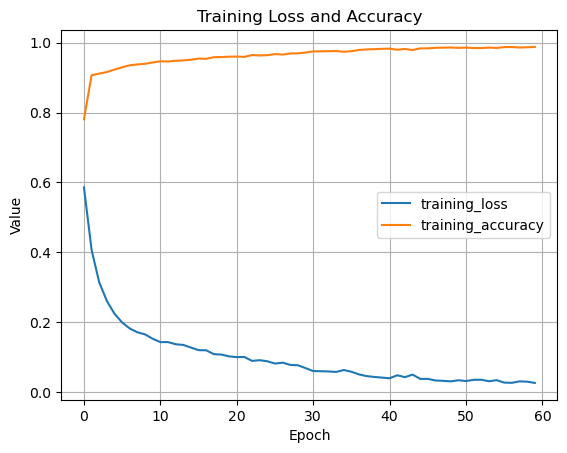

In [10]:

plt.plot(retVal.history['loss'], label='training_loss')


if 'accuracy' in retVal.history:
    plt.plot(retVal.history['accuracy'], label='training_accuracy')


plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Training Loss and Accuracy')
plt.legend()


plt.grid(True)


plt.show()

In [11]:
def predict16(valMap, model, shape = 256):
    
    img = valMap['img'][:16]
    mask = valMap['mask'][:16]

    imgProc = img[:16]
    imgProc = np.array(img)

    predictions = model.predict(imgProc)


    return predictions, imgProc, mask


def Plotter(img, predMask, groundTruth):
    plt.figure(figsize=(9,9))

    _extracted_from_Plotter_4(1, img, ' image')
    _extracted_from_Plotter_4(2, predMask, 'Predicted mask')
    _extracted_from_Plotter_4(3, groundTruth, 'Actual mask')



def _extracted_from_Plotter_4(arg0, arg1, arg2):
    plt.subplot(1, 3, arg0)
    plt.imshow(arg1)
    plt.title(arg2)

1/1 [==============================] - 2s 2s/step


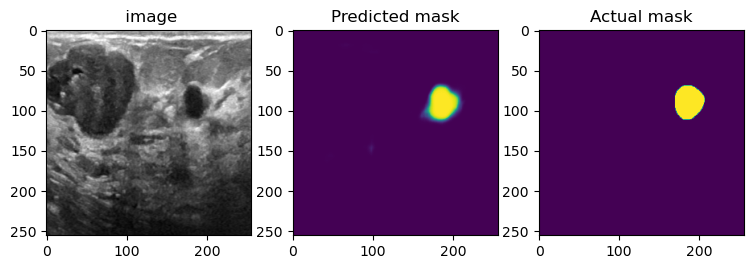

In [12]:
sixteenPrediction, actuals, masks = predict16(framObjTrain, myTransformer)
Plotter(actuals[1], sixteenPrediction[1][:,:,0], masks[1])


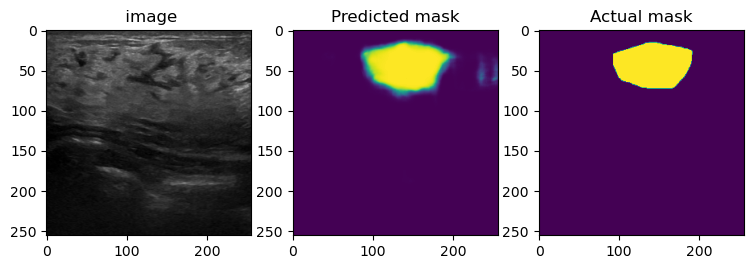

In [13]:
Plotter(actuals[2], sixteenPrediction[2][:,:,0], masks[2])


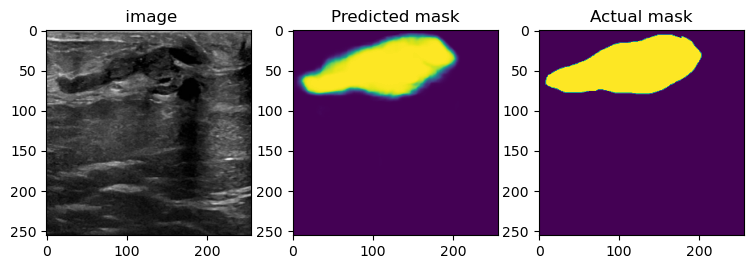

In [14]:
Plotter(actuals[3], sixteenPrediction[3][:,:,0], masks[3])


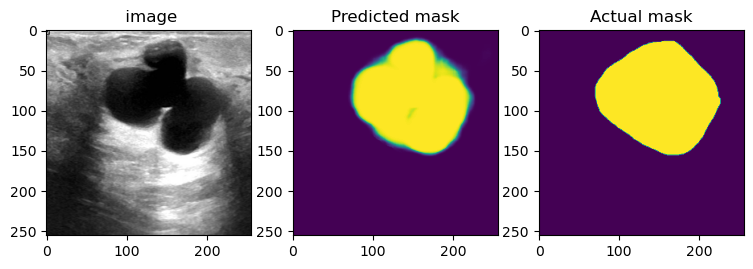

In [15]:
Plotter(actuals[5], sixteenPrediction[5][:,:,0], masks[5])


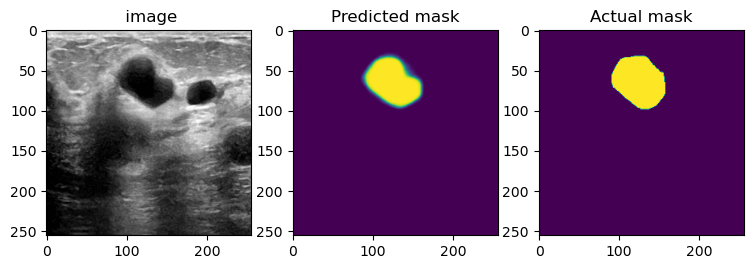

In [16]:
Plotter(actuals[7], sixteenPrediction[7][:,:,0], masks[7])


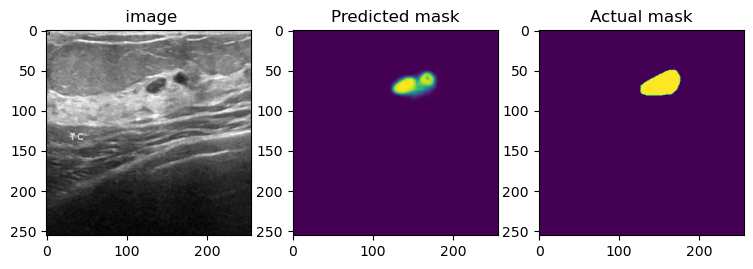

In [17]:
Plotter(actuals[8], sixteenPrediction[8][:,:,0], masks[8])


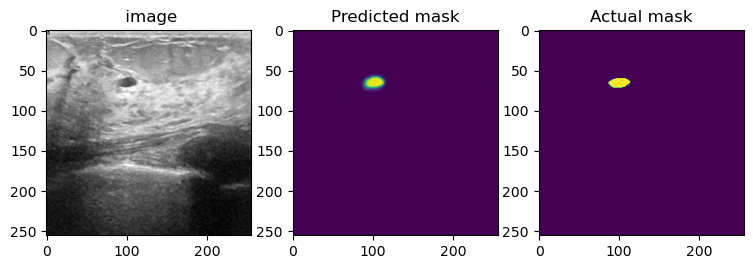

In [18]:
Plotter(actuals[9], sixteenPrediction[9][:,:,0], masks[9])


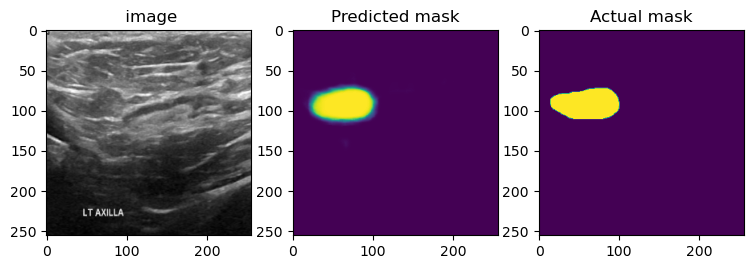

In [19]:
Plotter(actuals[10], sixteenPrediction[10][:,:,0], masks[10])


In [20]:
myTransformer.save('BreastCancerSegmentor.h5')


C:\Users\OFFICE\AppData\Roaming\Python\Python310\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [22]:
import os
import cv2
import numpy as np
from PIL import Image  
from tensorflow.keras.preprocessing.image import load_img, img_to_array

info = [
    'benign'   ,  
    'normal'   ,  
    'malignant',  
]
path = 'C:/Users/OFFICE/Documents/mp/Dataset_BUSI_with_GT'
X = []
y = []

label_num = -1

for label_class in os.listdir(path):
    
    new_path   = os.path.join(path, label_class)
    label_num += 1
    
    for img in os.listdir(new_path):
        if 'mask' not in img:
            
            y.append(label_num)
            x = cv2.imread(os.path.join(new_path, img), cv2.IMREAD_GRAYSCALE)
            resized_x = cv2.resize(x, (256, 256))
            processed_x = img_to_array(Image.fromarray(resized_x))
            X.append(processed_x)


X = np.array(X)
y = np.array(y)




In [23]:
X/= 255.0


In [24]:
from tensorflow.keras.utils import to_categorical


In [25]:
y = to_categorical(y)


In [26]:
print(X.shape)
print(y.shape)


(780, 256, 256, 1)
(780, 3)


In [27]:
print(X.min())
print(X.max())


0.0
1.0


(-0.5, 255.5, 255.5, -0.5)

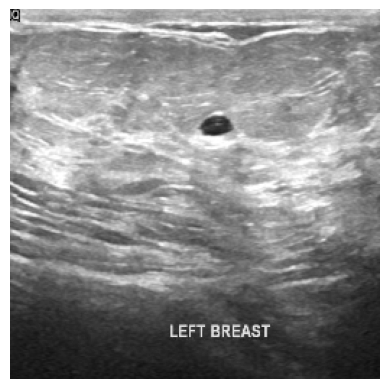

In [28]:
plt.imshow(X[0], 'gray')
plt.axis('off')


In [29]:
from keras.models import load_model


In [30]:
localize = load_model('./BreastCancerSegmentor.h5')


In [31]:

X_rgb = np.repeat(X, 3, axis=-1)
X_resized = np.array([cv2.resize(img, (256, 256)) for img in X_rgb])


M = localize.predict(X_resized)


25/25 [==============================] - 91s 4s/step


3.288975e-06
1.0


(-0.5, 255.5, 255.5, -0.5)

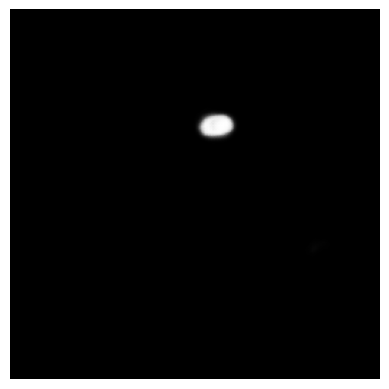

In [32]:
print(M.min())
print(M.max())

plt.imshow(M[0], 'gray')
plt.axis('off')


In [33]:
import pandas
import seaborn


Text(0.5, 1.0, 'Distribution of classes accross the entire dataset')

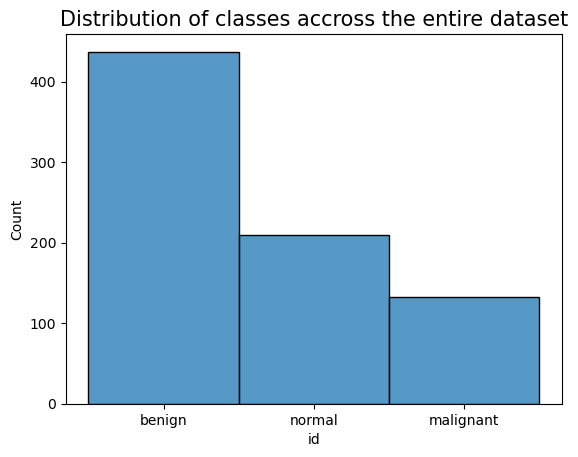

In [34]:
seaborn.histplot(data = pandas.DataFrame({'id' : [info[p] for p in np.argmax(y, axis = 1)]}), x = 'id')
plt.title('Distribution of classes accross the entire dataset', fontsize = 15)


In [35]:
X_train, X_test, y_train, y_test = train_test_split(M, y, test_size = 0.1, shuffle = True, random_state = 1)


In [36]:
print(X_train.shape)
print(y_train.shape)


(702, 256, 256, 1)
(702, 3)


In [37]:
print(X_test.shape)
print(y_test.shape)


(78, 256, 256, 1)
(78, 3)


In [38]:
from numpy.random import randint


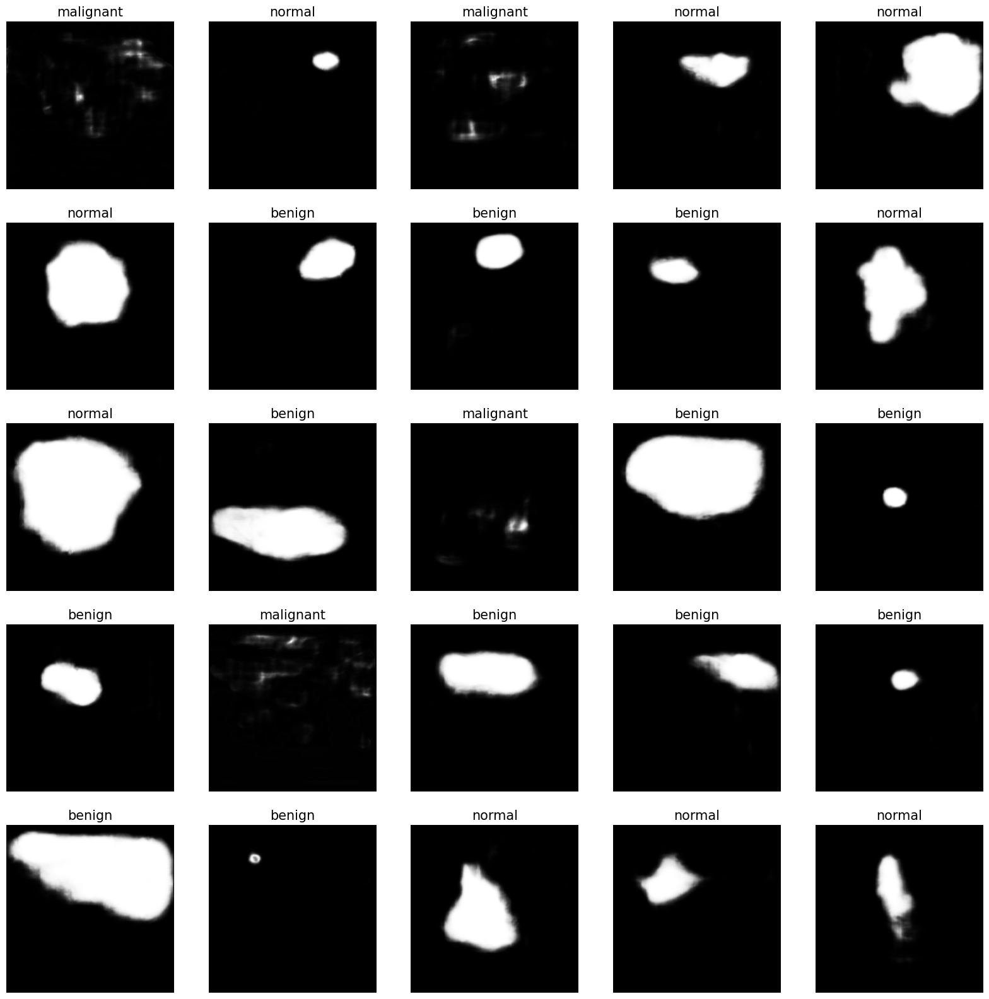

In [39]:
plt.figure(figsize = (20,20))
i = 0
SIZE = 702
while i < 25 :
    
    x = randint(0, SIZE)
    plt.subplot(5,5,i+1)
    plt.imshow(X_train[x], 'gray')
    plt.title(f'{info[np.argmax(y_train[x])]}', fontsize = 15)
    plt.axis('off')
    
    i += 1
plt.show()

In [40]:
from keras.preprocessing.image import ImageDataGenerator


In [41]:
train_gen = ImageDataGenerator(horizontal_flip = True, rotation_range = 15, width_shift_range = [-10, 10], height_shift_range = [-10, 10], zoom_range = [0.80, 1.00])


In [42]:
train_gen.fit(X_train)


In [43]:
pointer = train_gen.flow(X_train, y_train)


In [44]:
trainX, trainy = pointer.next()


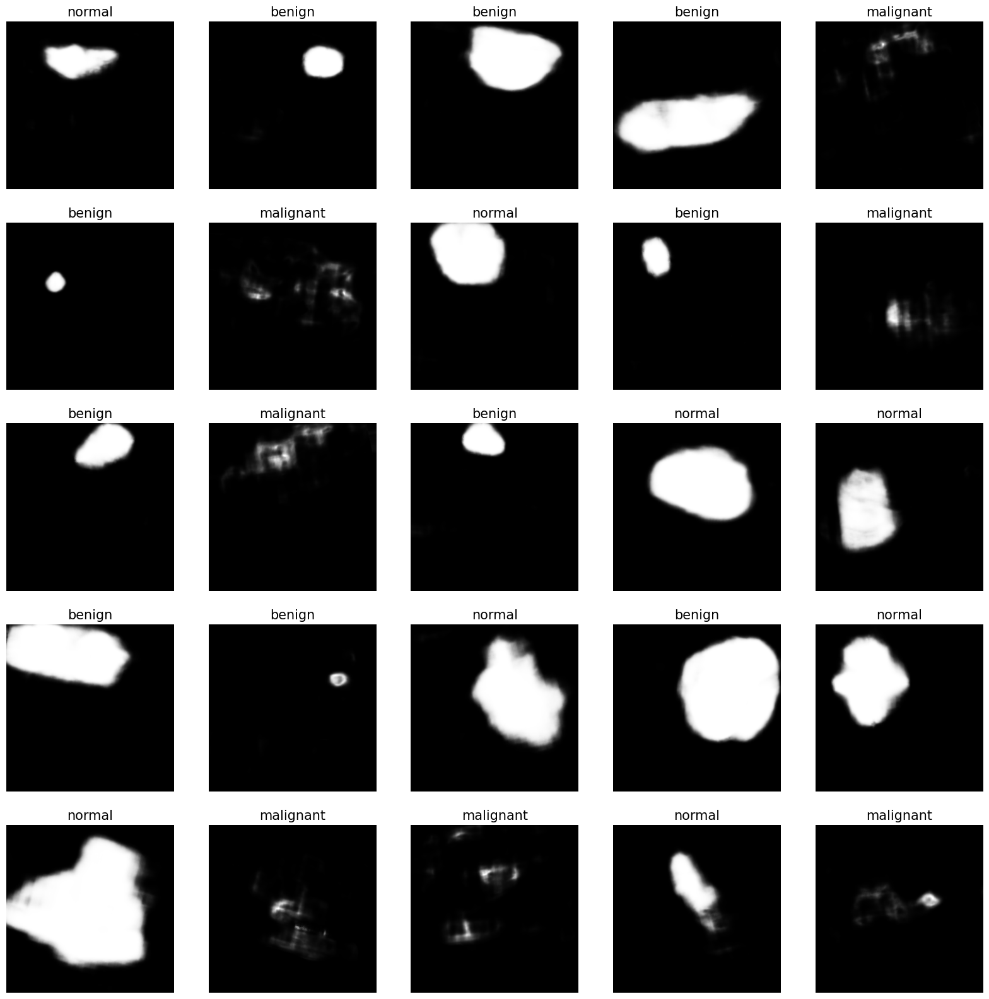

In [45]:
plt.figure(figsize = (20,20))

i = 0

while i < 25 :
    
    plt.subplot(5, 5, i+1)
    plt.imshow(trainX[i], 'gray')
    plt.title(f'{info[np.argmax(trainy[i])]}', fontsize = 15)
    plt.axis('off')
    
    i += 1
plt.show()

In [46]:
import tensorflow as tf
from tensorflow.keras.layers import BatchNormalization, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Rescaling
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential

y_train = y_train.astype(np.int32)
y_test = y_test.astype(np.int32)


In [47]:
model = Sequential([
    Rescaling(1./255, input_shape=(256, 256, 1)),
    Conv2D(16, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(32, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(64, 3, padding='same', activation='relu'),
    MaxPooling2D(),
    Dropout(0.5),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(3, activation='softmax')
])


In [48]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',  
              metrics=['accuracy'])


In [49]:
from tensorflow.keras.utils import plot_model


In [50]:
plot_model(model, 'cancer_classify.png', show_shapes = True)


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [51]:

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)


model.summary()


X_train shape: (702, 256, 256, 1)
X_test shape: (78, 256, 256, 1)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 1)       0         
                                                                 
 conv2d_38 (Conv2D)          (None, 256, 256, 16)      160       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 128, 128, 16)      0         
 g2D)                                                            
                                                                 
 conv2d_39 (Conv2D)          (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 64, 64, 32)        0         
 g2D)                                                            
                                                        

In [52]:
checkp = ModelCheckpoint('./valid_classifier.h5', monitor='val_accuracy', save_best_only=True, verbose=1)


In [53]:
import numpy as np


print("Data types - y_train:", y_train.dtype, "y_test:", y_test.dtype)


unique_train_classes = np.unique(y_train)
unique_test_classes = np.unique(y_test)
print("Unique class indices - Train:", unique_train_classes, "Test:", unique_test_classes)


Data types - y_train: int32 y_test: int32
Unique class indices - Train: [0 1] Test: [0 1]


In [54]:

batch_size = 64  


print(X_train.shape)  
print(y_train.shape)  

history = model.fit(X_train, y_train, batch_size=batch_size, epochs=2000, validation_data=(X_test, y_test), callbacks=[checkp])


(702, 256, 256, 1)
(702, 3)
Epoch 1/2000
11/11 [==============================] - ETA: 0s - loss: 1.0093 - accuracy: 0.5370
Epoch 1: val_accuracy improved from -inf to 0.53846, saving model to .\valid_classifier.h5


C:\Users\OFFICE\AppData\Roaming\Python\Python310\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


11/11 [==============================] - 31s 3s/step - loss: 1.0093 - accuracy: 0.5370 - val_loss: 1.0152 - val_accuracy: 0.5385
Epoch 2/2000
11/11 [==============================] - ETA: 0s - loss: 1.0038 - accuracy: 0.5627
Epoch 2: val_accuracy did not improve from 0.53846
11/11 [==============================] - 28s 3s/step - loss: 1.0038 - accuracy: 0.5627 - val_loss: 1.0070 - val_accuracy: 0.5385
Epoch 3/2000
11/11 [==============================] - ETA: 0s - loss: 0.9873 - accuracy: 0.5627
Epoch 3: val_accuracy did not improve from 0.53846
11/11 [==============================] - 28s 3s/step - loss: 0.9873 - accuracy: 0.5627 - val_loss: 0.9924 - val_accuracy: 0.5385
Epoch 4/2000
11/11 [==============================] - ETA: 0s - loss: 0.9815 - accuracy: 0.5627
Epoch 4: val_accuracy did not improve from 0.53846
11/11 [==============================] - 28s 3s/step - loss: 0.9815 - accuracy: 0.5627 - val_loss: 1.0051 - val_accuracy: 0.5385
Epoch 5/2000
11/11 [=======================

11/11 [==============================] - 28s 3s/step - loss: 0.6105 - accuracy: 0.7764 - val_loss: 0.7915 - val_accuracy: 0.6538
Epoch 31/2000
11/11 [==============================] - ETA: 0s - loss: 0.5795 - accuracy: 0.7863
Epoch 31: val_accuracy did not improve from 0.69231
11/11 [==============================] - 27s 3s/step - loss: 0.5795 - accuracy: 0.7863 - val_loss: 0.6541 - val_accuracy: 0.6923
Epoch 32/2000
11/11 [==============================] - ETA: 0s - loss: 0.5473 - accuracy: 0.7963
Epoch 32: val_accuracy improved from 0.69231 to 0.74359, saving model to .\valid_classifier.h5
11/11 [==============================] - 28s 3s/step - loss: 0.5473 - accuracy: 0.7963 - val_loss: 0.6611 - val_accuracy: 0.7436
Epoch 33/2000
11/11 [==============================] - ETA: 0s - loss: 0.5397 - accuracy: 0.8006
Epoch 33: val_accuracy did not improve from 0.74359
11/11 [==============================] - 28s 3s/step - loss: 0.5397 - accuracy: 0.8006 - val_loss: 0.6663 - val_accuracy: 0

Epoch 60/2000
11/11 [==============================] - ETA: 0s - loss: 0.1579 - accuracy: 0.9444
Epoch 60: val_accuracy did not improve from 0.76923
11/11 [==============================] - 27s 2s/step - loss: 0.1579 - accuracy: 0.9444 - val_loss: 0.8783 - val_accuracy: 0.7308
Epoch 61/2000
11/11 [==============================] - ETA: 0s - loss: 0.1442 - accuracy: 0.9587
Epoch 61: val_accuracy did not improve from 0.76923
11/11 [==============================] - 27s 2s/step - loss: 0.1442 - accuracy: 0.9587 - val_loss: 0.9228 - val_accuracy: 0.7692
Epoch 62/2000
11/11 [==============================] - ETA: 0s - loss: 0.1275 - accuracy: 0.9644
Epoch 62: val_accuracy did not improve from 0.76923
11/11 [==============================] - 28s 3s/step - loss: 0.1275 - accuracy: 0.9644 - val_loss: 0.8690 - val_accuracy: 0.7692
Epoch 63/2000
11/11 [==============================] - ETA: 0s - loss: 0.1272 - accuracy: 0.9573
Epoch 63: val_accuracy improved from 0.76923 to 0.79487, saving model

11/11 [==============================] - 27s 2s/step - loss: 0.0169 - accuracy: 0.9957 - val_loss: 1.5224 - val_accuracy: 0.7821
Epoch 119/2000
11/11 [==============================] - ETA: 0s - loss: 0.0232 - accuracy: 0.9957
Epoch 119: val_accuracy did not improve from 0.80769
11/11 [==============================] - 28s 3s/step - loss: 0.0232 - accuracy: 0.9957 - val_loss: 1.5647 - val_accuracy: 0.7821
Epoch 120/2000
11/11 [==============================] - ETA: 0s - loss: 0.0251 - accuracy: 0.9957
Epoch 120: val_accuracy did not improve from 0.80769
11/11 [==============================] - 28s 3s/step - loss: 0.0251 - accuracy: 0.9957 - val_loss: 1.5000 - val_accuracy: 0.7821
Epoch 121/2000
11/11 [==============================] - ETA: 0s - loss: 0.0257 - accuracy: 0.9943
Epoch 121: val_accuracy did not improve from 0.80769
11/11 [==============================] - 27s 2s/step - loss: 0.0257 - accuracy: 0.9943 - val_loss: 1.4985 - val_accuracy: 0.7821
Epoch 122/2000
11/11 [=========

Epoch 148/2000
11/11 [==============================] - ETA: 0s - loss: 0.0178 - accuracy: 0.9943
Epoch 148: val_accuracy did not improve from 0.80769
11/11 [==============================] - 27s 2s/step - loss: 0.0178 - accuracy: 0.9943 - val_loss: 1.4660 - val_accuracy: 0.7692
Epoch 149/2000
11/11 [==============================] - ETA: 0s - loss: 0.0184 - accuracy: 0.9943
Epoch 149: val_accuracy did not improve from 0.80769
11/11 [==============================] - 27s 3s/step - loss: 0.0184 - accuracy: 0.9943 - val_loss: 1.5047 - val_accuracy: 0.7692
Epoch 150/2000
11/11 [==============================] - ETA: 0s - loss: 0.0129 - accuracy: 0.9972
Epoch 150: val_accuracy did not improve from 0.80769
11/11 [==============================] - 28s 3s/step - loss: 0.0129 - accuracy: 0.9972 - val_loss: 1.5235 - val_accuracy: 0.7692
Epoch 151/2000
11/11 [==============================] - ETA: 0s - loss: 0.0177 - accuracy: 0.9957
Epoch 151: val_accuracy did not improve from 0.80769
11/11 [==

11/11 [==============================] - ETA: 0s - loss: 0.0192 - accuracy: 0.9957
Epoch 206: val_accuracy did not improve from 0.80769
11/11 [==============================] - 25s 2s/step - loss: 0.0192 - accuracy: 0.9957 - val_loss: 1.5361 - val_accuracy: 0.7692
Epoch 207/2000
11/11 [==============================] - ETA: 0s - loss: 0.0106 - accuracy: 0.9972
Epoch 207: val_accuracy did not improve from 0.80769
11/11 [==============================] - 25s 2s/step - loss: 0.0106 - accuracy: 0.9972 - val_loss: 1.5880 - val_accuracy: 0.7692
Epoch 208/2000
11/11 [==============================] - ETA: 0s - loss: 0.0164 - accuracy: 0.9943
Epoch 208: val_accuracy did not improve from 0.80769
11/11 [==============================] - 25s 2s/step - loss: 0.0164 - accuracy: 0.9943 - val_loss: 1.5971 - val_accuracy: 0.7821
Epoch 209/2000
11/11 [==============================] - ETA: 0s - loss: 0.0185 - accuracy: 0.9943
Epoch 209: val_accuracy did not improve from 0.80769
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0111 - accuracy: 0.9957
Epoch 264: val_accuracy did not improve from 0.82051
11/11 [==============================] - 28s 3s/step - loss: 0.0111 - accuracy: 0.9957 - val_loss: 1.6237 - val_accuracy: 0.7949
Epoch 265/2000
11/11 [==============================] - ETA: 0s - loss: 0.0119 - accuracy: 0.9957
Epoch 265: val_accuracy did not improve from 0.82051
11/11 [==============================] - 28s 3s/step - loss: 0.0119 - accuracy: 0.9957 - val_loss: 1.7793 - val_accuracy: 0.8077
Epoch 266/2000
11/11 [==============================] - ETA: 0s - loss: 0.0119 - accuracy: 0.9957
Epoch 266: val_accuracy did not improve from 0.82051
11/11 [==============================] - 27s 3s/step - loss: 0.0119 - accuracy: 0.9957 - val_loss: 1.6845 - val_accuracy: 0.7949
Epoch 267/2000
11/11 [==============================] - ETA: 0s - loss: 0.0102 - accuracy: 0.9972
Epoch 267: val_accuracy did not improve from 0.82051
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0185 - accuracy: 0.9943
Epoch 322: val_accuracy did not improve from 0.82051
11/11 [==============================] - 27s 2s/step - loss: 0.0185 - accuracy: 0.9943 - val_loss: 1.7579 - val_accuracy: 0.8077
Epoch 323/2000
11/11 [==============================] - ETA: 0s - loss: 0.0093 - accuracy: 0.9972
Epoch 323: val_accuracy did not improve from 0.82051
11/11 [==============================] - 28s 3s/step - loss: 0.0093 - accuracy: 0.9972 - val_loss: 1.7669 - val_accuracy: 0.8077
Epoch 324/2000
11/11 [==============================] - ETA: 0s - loss: 0.0090 - accuracy: 0.9957
Epoch 324: val_accuracy did not improve from 0.82051
11/11 [==============================] - 28s 3s/step - loss: 0.0090 - accuracy: 0.9957 - val_loss: 1.6846 - val_accuracy: 0.8077
Epoch 325/2000
11/11 [==============================] - ETA: 0s - loss: 0.0072 - accuracy: 0.9972
Epoch 325: val_accuracy did not improve from 0.82051
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0085 - accuracy: 0.9986
Epoch 380: val_accuracy did not improve from 0.82051
11/11 [==============================] - 26s 2s/step - loss: 0.0085 - accuracy: 0.9986 - val_loss: 2.0697 - val_accuracy: 0.8077
Epoch 381/2000
11/11 [==============================] - ETA: 0s - loss: 0.0078 - accuracy: 0.9957
Epoch 381: val_accuracy did not improve from 0.82051
11/11 [==============================] - 26s 2s/step - loss: 0.0078 - accuracy: 0.9957 - val_loss: 1.8318 - val_accuracy: 0.8077
Epoch 382/2000
11/11 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 0.9986
Epoch 382: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0036 - accuracy: 0.9986 - val_loss: 1.8062 - val_accuracy: 0.8077
Epoch 383/2000
11/11 [==============================] - ETA: 0s - loss: 0.0105 - accuracy: 0.9972
Epoch 383: val_accuracy did not improve from 0.82051
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9986
Epoch 438: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0024 - accuracy: 0.9986 - val_loss: 2.2383 - val_accuracy: 0.7821
Epoch 439/2000
11/11 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 0.9986
Epoch 439: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0028 - accuracy: 0.9986 - val_loss: 2.2028 - val_accuracy: 0.7821
Epoch 440/2000
11/11 [==============================] - ETA: 0s - loss: 0.0053 - accuracy: 0.9972
Epoch 440: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0053 - accuracy: 0.9972 - val_loss: 1.9988 - val_accuracy: 0.7949
Epoch 441/2000
11/11 [==============================] - ETA: 0s - loss: 0.0081 - accuracy: 0.9972
Epoch 441: val_accuracy did not improve from 0.82051
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0033 - accuracy: 0.9986
Epoch 496: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0033 - accuracy: 0.9986 - val_loss: 2.4978 - val_accuracy: 0.7949
Epoch 497/2000
11/11 [==============================] - ETA: 0s - loss: 0.0033 - accuracy: 0.9986
Epoch 497: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0033 - accuracy: 0.9986 - val_loss: 2.5273 - val_accuracy: 0.7821
Epoch 498/2000
11/11 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 0.9986
Epoch 498: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0030 - accuracy: 0.9986 - val_loss: 2.4991 - val_accuracy: 0.7949
Epoch 499/2000
11/11 [==============================] - ETA: 0s - loss: 0.0066 - accuracy: 0.9972
Epoch 499: val_accuracy did not improve from 0.82051
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 0.9986
Epoch 554: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0030 - accuracy: 0.9986 - val_loss: 2.2803 - val_accuracy: 0.7692
Epoch 555/2000
11/11 [==============================] - ETA: 0s - loss: 0.0061 - accuracy: 0.9972
Epoch 555: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0061 - accuracy: 0.9972 - val_loss: 2.1489 - val_accuracy: 0.7821
Epoch 556/2000
11/11 [==============================] - ETA: 0s - loss: 0.0101 - accuracy: 0.9957
Epoch 556: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0101 - accuracy: 0.9957 - val_loss: 2.1400 - val_accuracy: 0.7692
Epoch 557/2000
11/11 [==============================] - ETA: 0s - loss: 0.0050 - accuracy: 0.9986
Epoch 557: val_accuracy did not improve from 0.82051
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 0.9972
Epoch 612: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0044 - accuracy: 0.9972 - val_loss: 2.1202 - val_accuracy: 0.8077
Epoch 613/2000
11/11 [==============================] - ETA: 0s - loss: 0.0142 - accuracy: 0.9972  
Epoch 613: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0142 - accuracy: 0.9972 - val_loss: 2.2272 - val_accuracy: 0.8205
Epoch 614/2000
11/11 [==============================] - ETA: 0s - loss: 0.0062 - accuracy: 0.9957
Epoch 614: val_accuracy did not improve from 0.82051
11/11 [==============================] - 25s 2s/step - loss: 0.0062 - accuracy: 0.9957 - val_loss: 2.5296 - val_accuracy: 0.7949
Epoch 615/2000
11/11 [==============================] - ETA: 0s - loss: 0.0048 - accuracy: 0.9986
Epoch 615: val_accuracy did not improve from 0.82051
11/11 [===============

11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000
Epoch 670: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.4782 - val_accuracy: 0.8333
Epoch 671/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986
Epoch 671: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0019 - accuracy: 0.9986 - val_loss: 2.4980 - val_accuracy: 0.8333
Epoch 672/2000
11/11 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 0.9986
Epoch 672: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0023 - accuracy: 0.9986 - val_loss: 2.4137 - val_accuracy: 0.8333
Epoch 673/2000
11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 0.9986
Epoch 673: val_accuracy did not improve from 0.84615
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 0.9986
Epoch 728: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0026 - accuracy: 0.9986 - val_loss: 2.4625 - val_accuracy: 0.8077
Epoch 729/2000
11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000
Epoch 729: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.4089 - val_accuracy: 0.8077
Epoch 730/2000
11/11 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 0.9957
Epoch 730: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0060 - accuracy: 0.9957 - val_loss: 2.3928 - val_accuracy: 0.8205
Epoch 731/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9972  
Epoch 731: val_accuracy did not improve from 0.84615
11/11 [===============

11/11 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 0.9986
Epoch 786: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0038 - accuracy: 0.9986 - val_loss: 2.5924 - val_accuracy: 0.7949
Epoch 787/2000
11/11 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 0.9972
Epoch 787: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0034 - accuracy: 0.9972 - val_loss: 2.6306 - val_accuracy: 0.7949
Epoch 788/2000
11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 1.0000
Epoch 788: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 2.6616 - val_accuracy: 0.7949
Epoch 789/2000
11/11 [==============================] - ETA: 0s - loss: 0.0028 - accuracy: 0.9972
Epoch 789: val_accuracy did not improve from 0.84615
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986  
Epoch 844: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0019 - accuracy: 0.9986 - val_loss: 2.6128 - val_accuracy: 0.7949
Epoch 845/2000
11/11 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.9972
Epoch 845: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0032 - accuracy: 0.9972 - val_loss: 2.6374 - val_accuracy: 0.7949
Epoch 846/2000
11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000
Epoch 846: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 2.6424 - val_accuracy: 0.7949
Epoch 847/2000
11/11 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 0.9972
Epoch 847: val_accuracy did not improve from 0.84615
11/11 [===============

11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9986
Epoch 902: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0024 - accuracy: 0.9986 - val_loss: 2.7025 - val_accuracy: 0.7949
Epoch 903/2000
11/11 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 1.0000  
Epoch 903: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 2.7074 - val_accuracy: 0.7949
Epoch 904/2000
11/11 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 0.9986
Epoch 904: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0036 - accuracy: 0.9986 - val_loss: 2.7267 - val_accuracy: 0.7949
Epoch 905/2000
11/11 [==============================] - ETA: 0s - loss: 0.0035 - accuracy: 0.9972
Epoch 905: val_accuracy did not improve from 0.84615
11/11 [===============

11/11 [==============================] - ETA: 0s - loss: 0.0077 - accuracy: 0.9972
Epoch 960: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0077 - accuracy: 0.9972 - val_loss: 2.5896 - val_accuracy: 0.8333
Epoch 961/2000
11/11 [==============================] - ETA: 0s - loss: 0.0304 - accuracy: 0.9915
Epoch 961: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0304 - accuracy: 0.9915 - val_loss: 3.6765 - val_accuracy: 0.8077
Epoch 962/2000
11/11 [==============================] - ETA: 0s - loss: 0.0080 - accuracy: 0.9972
Epoch 962: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0080 - accuracy: 0.9972 - val_loss: 4.0372 - val_accuracy: 0.7821
Epoch 963/2000
11/11 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 0.9972
Epoch 963: val_accuracy did not improve from 0.84615
11/11 [=================

11/11 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 0.9972
Epoch 1018: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0036 - accuracy: 0.9972 - val_loss: 3.5738 - val_accuracy: 0.7949
Epoch 1019/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986
Epoch 1019: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0019 - accuracy: 0.9986 - val_loss: 3.5339 - val_accuracy: 0.8077
Epoch 1020/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9986
Epoch 1020: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0031 - accuracy: 0.9986 - val_loss: 3.5235 - val_accuracy: 0.8077
Epoch 1021/2000
11/11 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.9986
Epoch 1021: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.9986
Epoch 1076: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 0.9986 - val_loss: 3.5131 - val_accuracy: 0.7949
Epoch 1077/2000
11/11 [==============================] - ETA: 0s - loss: 0.0033 - accuracy: 0.9986  
Epoch 1077: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0033 - accuracy: 0.9986 - val_loss: 3.5078 - val_accuracy: 0.7949
Epoch 1078/2000
11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.9986
Epoch 1078: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 0.9986 - val_loss: 3.3383 - val_accuracy: 0.7949
Epoch 1079/2000
11/11 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 0.9986
Epoch 1079: val_accuracy did not improve from 0.84615
11/11 [========

11/11 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.9972
Epoch 1134: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0025 - accuracy: 0.9972 - val_loss: 3.1829 - val_accuracy: 0.8077
Epoch 1135/2000
11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9972
Epoch 1135: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0024 - accuracy: 0.9972 - val_loss: 3.1274 - val_accuracy: 0.8077
Epoch 1136/2000
11/11 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.9986  
Epoch 1136: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0018 - accuracy: 0.9986 - val_loss: 3.0524 - val_accuracy: 0.8077
Epoch 1137/2000
11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9986
Epoch 1137: val_accuracy did not improve from 0.84615
11/11 [========

11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000
Epoch 1192: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 3.3530 - val_accuracy: 0.7949
Epoch 1193/2000
11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000    
Epoch 1193: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 3.3788 - val_accuracy: 0.7949
Epoch 1194/2000
11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 1.0000
Epoch 1194: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 3.3866 - val_accuracy: 0.7821
Epoch 1195/2000
11/11 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.9986
Epoch 1195: val_accuracy did not improve from 0.84615
11/11 [======

11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9972
Epoch 1221: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0031 - accuracy: 0.9972 - val_loss: 3.2904 - val_accuracy: 0.7692
Epoch 1222/2000
11/11 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.9986
Epoch 1222: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0018 - accuracy: 0.9986 - val_loss: 3.5445 - val_accuracy: 0.7949
Epoch 1223/2000
11/11 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 0.9986  
Epoch 1223: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0017 - accuracy: 0.9986 - val_loss: 3.5969 - val_accuracy: 0.7821
Epoch 1224/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986
Epoch 1224: val_accuracy did not improve from 0.84615
11/11 [========

11/11 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 0.9972
Epoch 1279: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0044 - accuracy: 0.9972 - val_loss: 3.6954 - val_accuracy: 0.7692
Epoch 1280/2000
11/11 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 0.9972  
Epoch 1280: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0034 - accuracy: 0.9972 - val_loss: 3.5788 - val_accuracy: 0.7692
Epoch 1281/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9986
Epoch 1281: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0031 - accuracy: 0.9986 - val_loss: 3.6042 - val_accuracy: 0.7692
Epoch 1282/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986    
Epoch 1282: val_accuracy did not improve from 0.84615
11/11 [====

11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986  
Epoch 1337: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0019 - accuracy: 0.9986 - val_loss: 4.0092 - val_accuracy: 0.7821
Epoch 1338/2000
11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.9986    
Epoch 1338: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0021 - accuracy: 0.9986 - val_loss: 4.0211 - val_accuracy: 0.7821
Epoch 1339/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9972
Epoch 1339: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0031 - accuracy: 0.9972 - val_loss: 3.9649 - val_accuracy: 0.7821
Epoch 1340/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9972
Epoch 1340: val_accuracy did not improve from 0.84615
11/11 [====

11/11 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.9972
Epoch 1395: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0025 - accuracy: 0.9972 - val_loss: 3.5755 - val_accuracy: 0.7692
Epoch 1396/2000
11/11 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 1.0000
Epoch 1396: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 3.5698 - val_accuracy: 0.7692
Epoch 1397/2000
11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.9986    
Epoch 1397: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 0.9986 - val_loss: 3.5688 - val_accuracy: 0.7692
Epoch 1398/2000
11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.9986
Epoch 1398: val_accuracy did not improve from 0.84615
11/11 [======

11/11 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 0.9972
Epoch 1453: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0026 - accuracy: 0.9972 - val_loss: 4.0003 - val_accuracy: 0.8077
Epoch 1454/2000
11/11 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.9986
Epoch 1454: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0025 - accuracy: 0.9986 - val_loss: 3.9785 - val_accuracy: 0.8077
Epoch 1455/2000
11/11 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.9986
Epoch 1455: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0032 - accuracy: 0.9986 - val_loss: 4.0518 - val_accuracy: 0.7949
Epoch 1456/2000
11/11 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 0.9972
Epoch 1456: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.9986
Epoch 1511: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0021 - accuracy: 0.9986 - val_loss: 4.6257 - val_accuracy: 0.7821
Epoch 1512/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986
Epoch 1512: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0019 - accuracy: 0.9986 - val_loss: 4.6146 - val_accuracy: 0.7821
Epoch 1513/2000
11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9986
Epoch 1513: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0024 - accuracy: 0.9986 - val_loss: 4.6132 - val_accuracy: 0.7821
Epoch 1514/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9972
Epoch 1514: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 0.9972
Epoch 1569: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0027 - accuracy: 0.9972 - val_loss: 4.6351 - val_accuracy: 0.8077
Epoch 1570/2000
11/11 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 0.9972
Epoch 1570: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0026 - accuracy: 0.9972 - val_loss: 4.6140 - val_accuracy: 0.8077
Epoch 1571/2000
11/11 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.9986
Epoch 1571: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0018 - accuracy: 0.9986 - val_loss: 4.5695 - val_accuracy: 0.8077
Epoch 1572/2000
11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9986
Epoch 1572: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 0.9986
Epoch 1627: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0027 - accuracy: 0.9986 - val_loss: 5.1185 - val_accuracy: 0.7692
Epoch 1628/2000
11/11 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9986
Epoch 1628: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0031 - accuracy: 0.9986 - val_loss: 5.8496 - val_accuracy: 0.7436
Epoch 1629/2000
11/11 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.9986
Epoch 1629: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0032 - accuracy: 0.9986 - val_loss: 5.8769 - val_accuracy: 0.7308
Epoch 1630/2000
11/11 [==============================] - ETA: 0s - loss: 0.0051 - accuracy: 0.9972
Epoch 1630: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000
Epoch 1685: val_accuracy did not improve from 0.84615
11/11 [==============================] - 28s 3s/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 4.5803 - val_accuracy: 0.8077
Epoch 1686/2000
11/11 [==============================] - ETA: 0s - loss: 0.0027 - accuracy: 0.9986
Epoch 1686: val_accuracy did not improve from 0.84615
11/11 [==============================] - 28s 3s/step - loss: 0.0027 - accuracy: 0.9986 - val_loss: 4.3573 - val_accuracy: 0.8077
Epoch 1687/2000
11/11 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.9972
Epoch 1687: val_accuracy did not improve from 0.84615
11/11 [==============================] - 28s 3s/step - loss: 0.0025 - accuracy: 0.9972 - val_loss: 4.8683 - val_accuracy: 0.7949
Epoch 1688/2000
11/11 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 0.9986
Epoch 1688: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.9972
Epoch 1743: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0025 - accuracy: 0.9972 - val_loss: 4.6082 - val_accuracy: 0.8077
Epoch 1744/2000
11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.9986    
Epoch 1744: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 0.9986 - val_loss: 4.5117 - val_accuracy: 0.8077
Epoch 1745/2000
11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000
Epoch 1745: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 4.4675 - val_accuracy: 0.8077
Epoch 1746/2000
11/11 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 0.9972
Epoch 1746: val_accuracy did not improve from 0.84615
11/11 [======

11/11 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 0.9986
Epoch 1801: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0036 - accuracy: 0.9986 - val_loss: 4.7546 - val_accuracy: 0.7949
Epoch 1802/2000
11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.9986
Epoch 1802: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 0.9986 - val_loss: 4.6132 - val_accuracy: 0.8077
Epoch 1803/2000
11/11 [==============================] - ETA: 0s - loss: 0.0062 - accuracy: 0.9957
Epoch 1803: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0062 - accuracy: 0.9957 - val_loss: 4.6592 - val_accuracy: 0.7821
Epoch 1804/2000
11/11 [==============================] - ETA: 0s - loss: 0.0073 - accuracy: 0.9972
Epoch 1804: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 0.9986
Epoch 1859: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0023 - accuracy: 0.9986 - val_loss: 4.0504 - val_accuracy: 0.7821
Epoch 1860/2000
11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.9972
Epoch 1860: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0021 - accuracy: 0.9972 - val_loss: 4.0884 - val_accuracy: 0.7821
Epoch 1861/2000
11/11 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000
Epoch 1861: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 4.1140 - val_accuracy: 0.7821
Epoch 1862/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986  
Epoch 1862: val_accuracy did not improve from 0.84615
11/11 [========

11/11 [==============================] - ETA: 0s - loss: 0.0066 - accuracy: 0.9972
Epoch 1917: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0066 - accuracy: 0.9972 - val_loss: 4.7869 - val_accuracy: 0.7821
Epoch 1918/2000
11/11 [==============================] - ETA: 0s - loss: 0.0024 - accuracy: 0.9986
Epoch 1918: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0024 - accuracy: 0.9986 - val_loss: 5.2419 - val_accuracy: 0.7949
Epoch 1919/2000
11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.9986
Epoch 1919: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0021 - accuracy: 0.9986 - val_loss: 5.3871 - val_accuracy: 0.7949
Epoch 1920/2000
11/11 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.9986
Epoch 1920: val_accuracy did not improve from 0.84615
11/11 [==========

11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 1.0000
Epoch 1975: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 4.9306 - val_accuracy: 0.7821
Epoch 1976/2000
11/11 [==============================] - ETA: 0s - loss: 0.0022 - accuracy: 0.9986
Epoch 1976: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0022 - accuracy: 0.9986 - val_loss: 4.9084 - val_accuracy: 0.7821
Epoch 1977/2000
11/11 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000
Epoch 1977: val_accuracy did not improve from 0.84615
11/11 [==============================] - 25s 2s/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 4.8955 - val_accuracy: 0.7821
Epoch 1978/2000
11/11 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.9986
Epoch 1978: val_accuracy did not improve from 0.84615
11/11 [==========

Text(0.5, 1.0, 'Loss val wrt. Epochs')

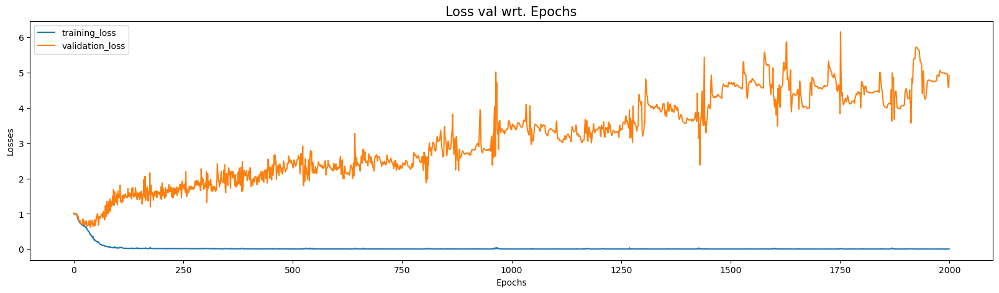

In [55]:
plt.figure(figsize = (20,5))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training_loss', 'validation_loss'])
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Loss val wrt. Epochs', fontsize = 15)

In [56]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report


In [57]:
model = keras.models.load_model('./valid_classifier.h5')


In [58]:
y_pred = model.predict(X_test)


3/3 [==============================] - 1s 219ms/step


In [59]:
y_pred = np.argmax(y_pred, axis = 1)
y_test = np.argmax(y_test, axis = 1)


In [60]:
print('Accuracy : ' + str(accuracy_score(y_test, y_pred)))
print(classification_report(y_test, y_pred, target_names = info))


Accuracy : 0.8461538461538461
              precision    recall  f1-score   support

      benign       0.82      0.95      0.88        42
      normal       1.00      0.70      0.82        23
   malignant       0.77      0.77      0.77        13

    accuracy                           0.85        78
   macro avg       0.86      0.81      0.82        78
weighted avg       0.86      0.85      0.84        78



In [61]:
cm = confusion_matrix(y_test,y_pred)


Text(0.5, 192.72222222222217, 'Predicted')

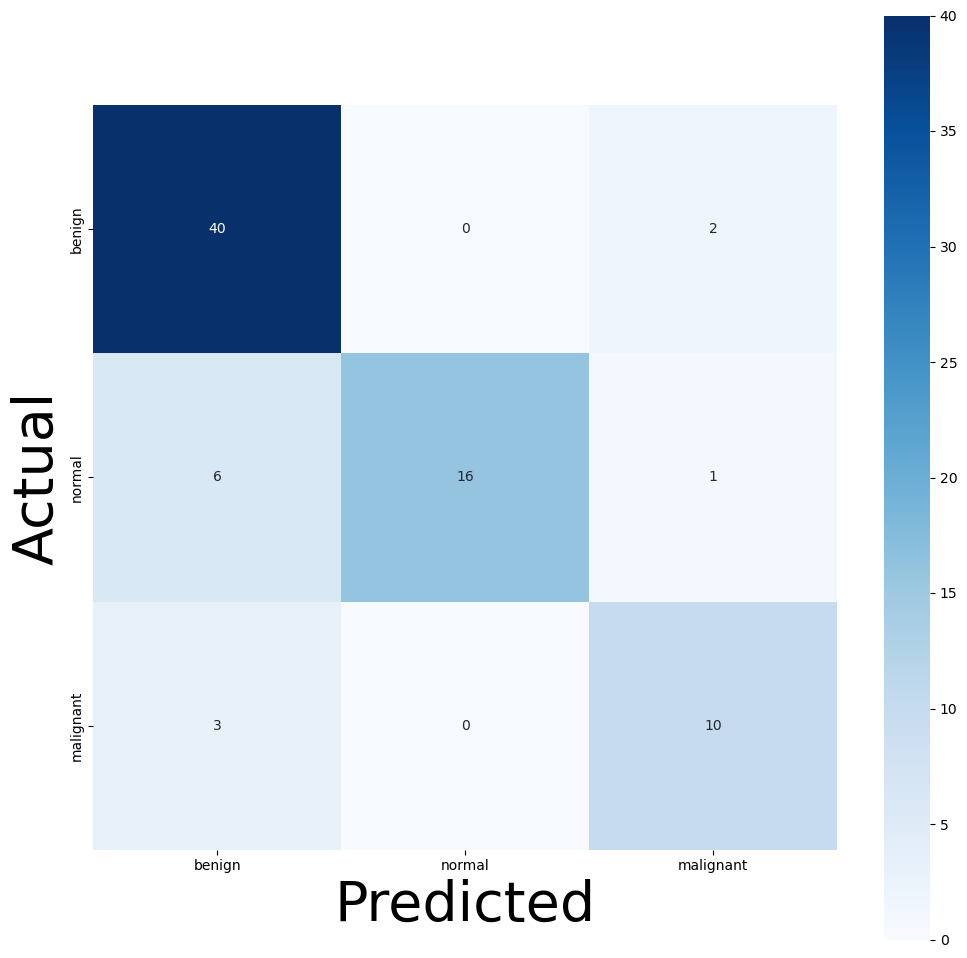

In [62]:
plt.figure(figsize = (12,12))
ax = seaborn.heatmap(cm, cmap=plt.cm.Blues, annot=True, square=True, xticklabels = info, yticklabels = info)
ax.set_ylabel('Actual', fontsize=40)
ax.set_xlabel('Predicted', fontsize=40)


In [66]:
import os


folder_path = 'C:/Users/OFFICE/Documents/mp/kaggle/working/input'


if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print(f"Folder '{folder_path}' created successfully.")
else:
    print(f"Folder '{folder_path}' already exists.")


Folder 'C:/Users/OFFICE/Documents/mp/kaggle/working/input' created successfully.


In [68]:
import os
import shutil


source_folder = 'C:/Users/OFFICE/Documents/mp/Dataset_BUSI_with_GT'
destination_folder = 'C:/Users/OFFICE/Documents/mp/kaggle/working/input'


class_names = ['benign', 'malignant', 'normal']


for class_name in class_names:
    class_folder = os.path.join(source_folder, class_name)
    img_count = 0
    
    for filename in os.listdir(class_folder):
        if filename.endswith('.png') and not filename.endswith('_mask.png'):
            img_path = os.path.join(class_folder, filename)
            dest_path = os.path.join(destination_folder, filename)
            
            
            shutil.copy(img_path, dest_path)
            
            img_count += 1
            if img_count >= 10:
                break

print("Images copied successfully.")


Images copied successfully.


In [72]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from skimage.transform import resize


class_names = ['benign', 'malignant', 'normal']


image_folder_path = 'C:/Users/OFFICE/Documents/mp/kaggle/working/input'  


segmentor_model = load_model('BreastCancerSegmentor.h5')


classification_model = load_model('valid_classifier.h5')


def prepare_image(image_path, target_size=(256, 256)):
    img = image.load_img(image_path, target_size=target_size)
    img = image.img_to_array(img)
    img = img / 255.0  
    return img

def prepare_image2(mask_pred, target_size=(256, 256)):
    img2 = image.load_img(mask_pred, color_mode='grayscale', target_size=target_size)
    img2 = image.img_to_array(img2)
    img2 = img2 / 255.0  
    img2 = np.expand_dims(img2, axis=-1)  
    return img2



In [73]:

def predict_and_visualize_masks(image_path):
    img = prepare_image(image_path)
    mask_pred = segmentor_model.predict(np.expand_dims(img, axis=0))[0][:, :, 0]

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(mask_pred, cmap='gray')
    plt.title('Predicted Mask')

    plt.show()


In [74]:

def predict_and_visualize_classification(mask_pred):
    img2 = prepare_image2(mask_pred)
    class_pred = classification_model.predict(np.expand_dims(img2, axis=0))[0]
    predicted_class = class_names[np.argmax(class_pred)]

    plt.imshow(image.load_img(mask_pred))
    plt.title(f'Predicted Class: {predicted_class}')
    plt.axis('off')
    plt.show()


1/1 [==============================] - 1s 579ms/step


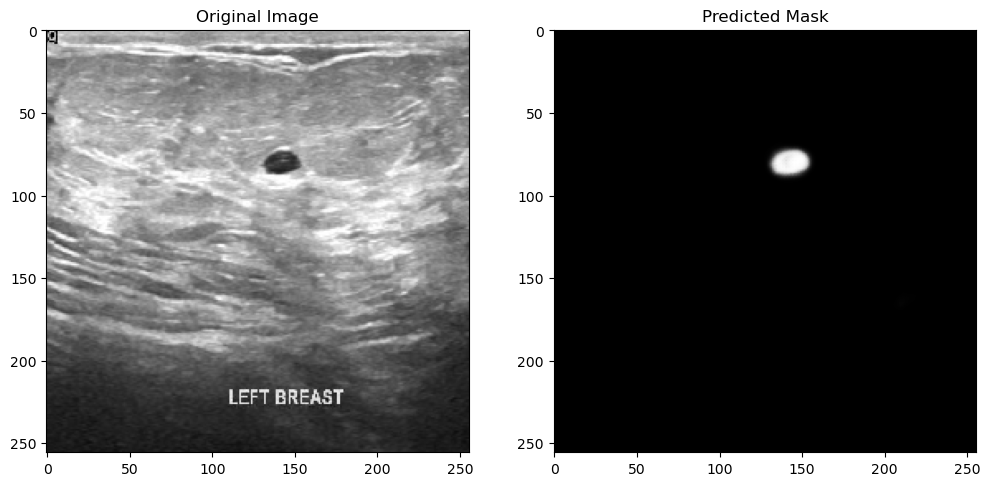

1/1 [==============================] - 0s 147ms/step


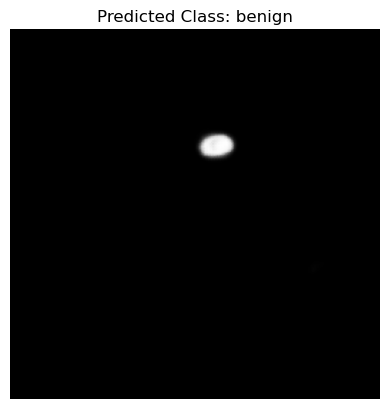

Original File Name: benign (1).png
1/1 [==============================] - 0s 185ms/step


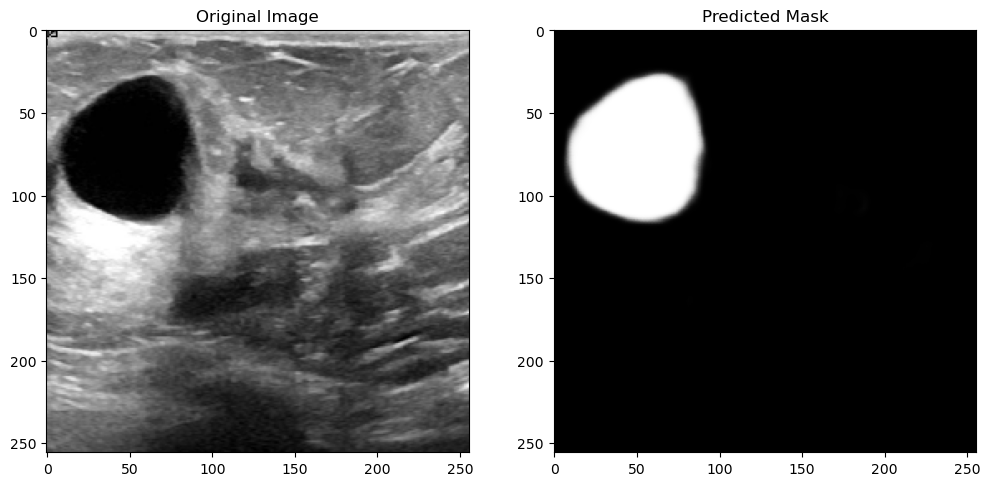

1/1 [==============================] - 0s 45ms/step


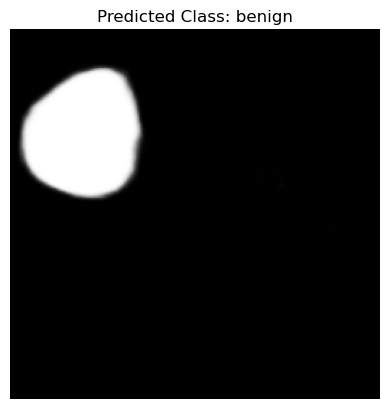

Original File Name: benign (10).png
1/1 [==============================] - 0s 177ms/step


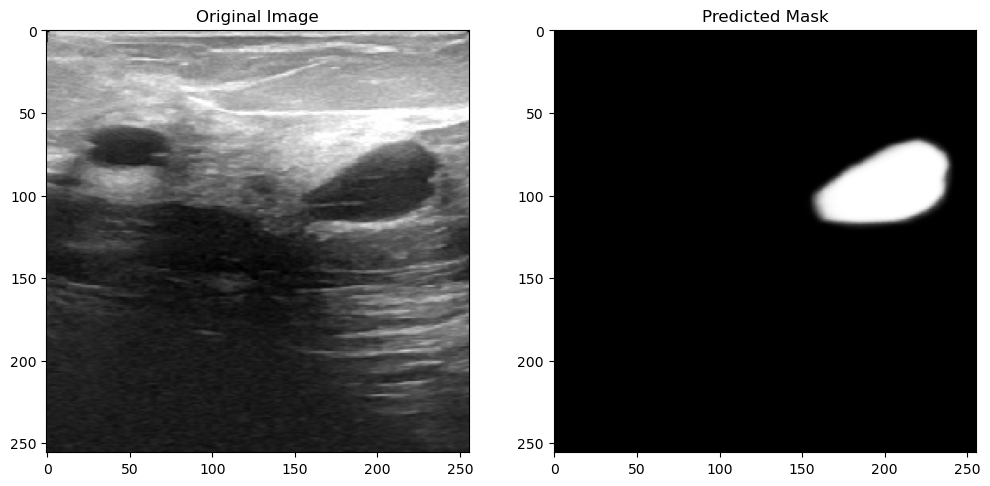

1/1 [==============================] - 0s 52ms/step


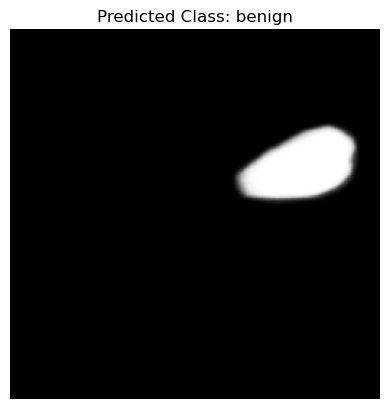

Original File Name: benign (100).png
1/1 [==============================] - 0s 220ms/step


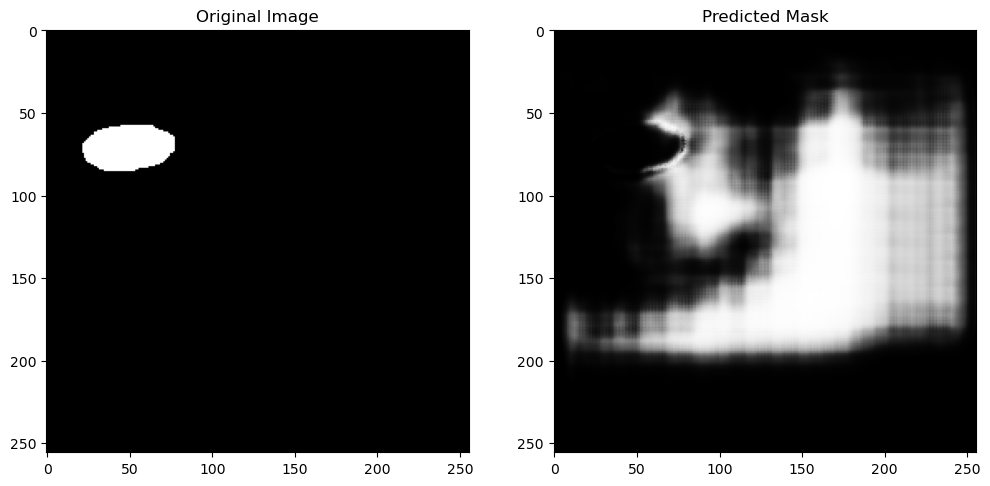

1/1 [==============================] - 0s 31ms/step


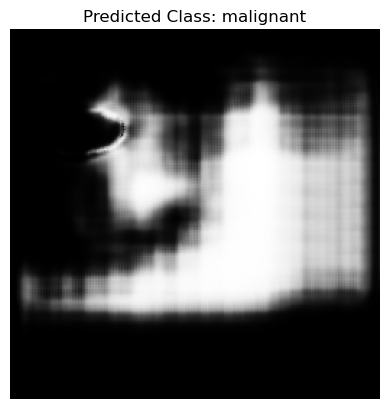

Original File Name: benign (100)_mask_1.png
1/1 [==============================] - 0s 182ms/step


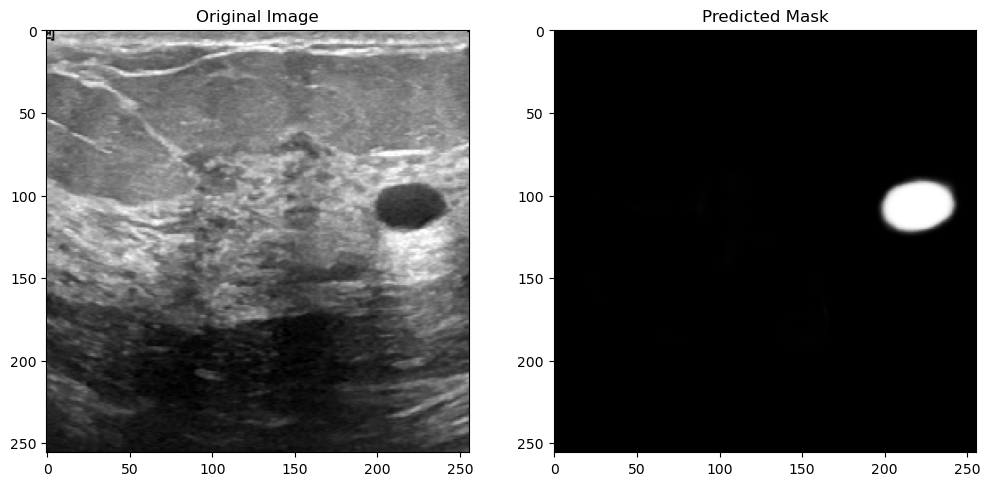

1/1 [==============================] - 0s 55ms/step


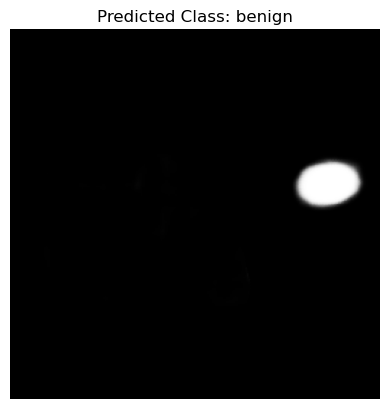

Original File Name: benign (101).png
1/1 [==============================] - 0s 172ms/step


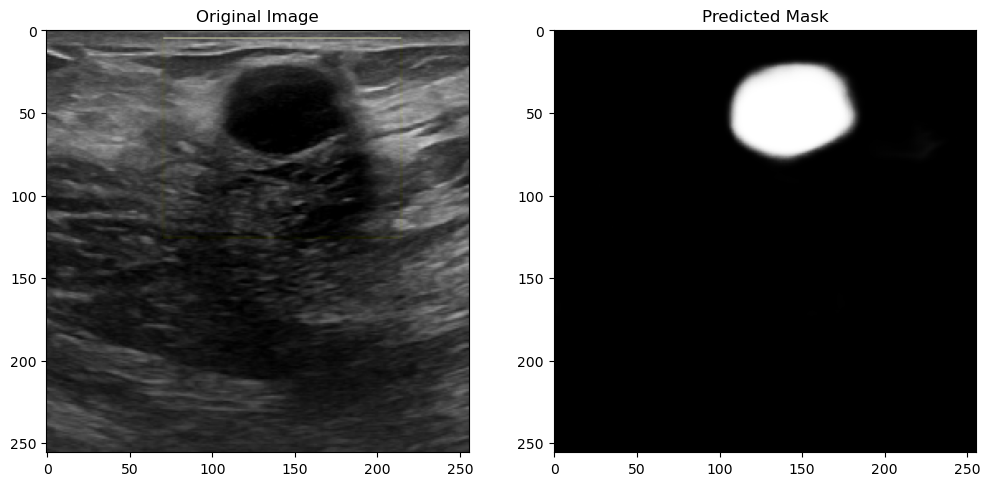

1/1 [==============================] - 0s 48ms/step


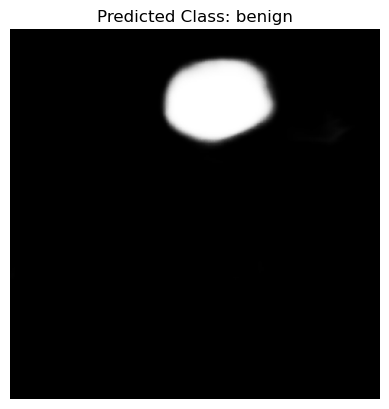

Original File Name: benign (102).png
1/1 [==============================] - 0s 217ms/step


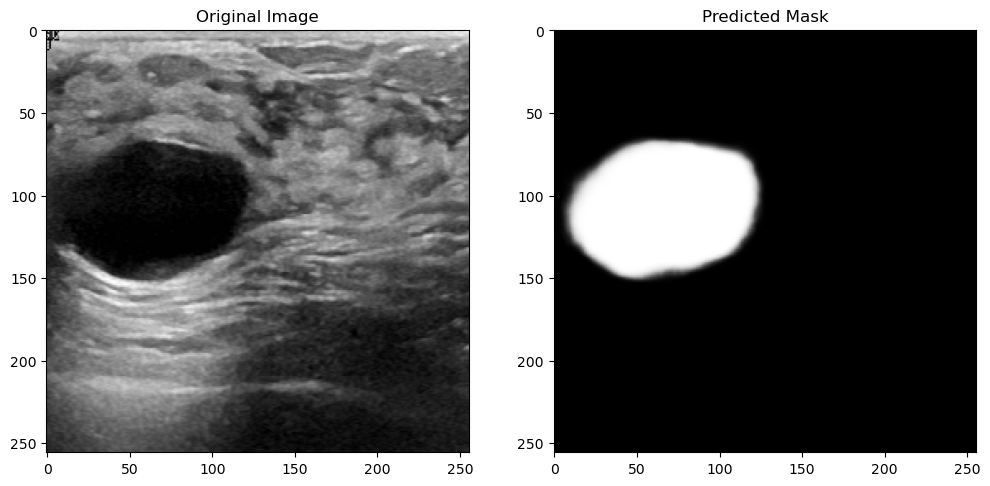

1/1 [==============================] - 0s 52ms/step


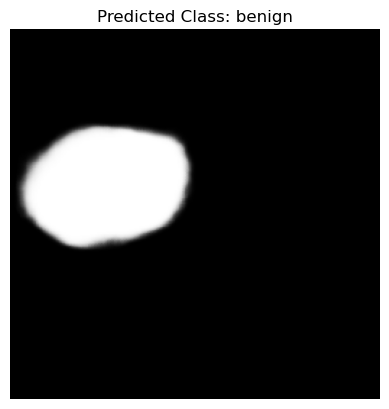

Original File Name: benign (103).png
1/1 [==============================] - 0s 201ms/step


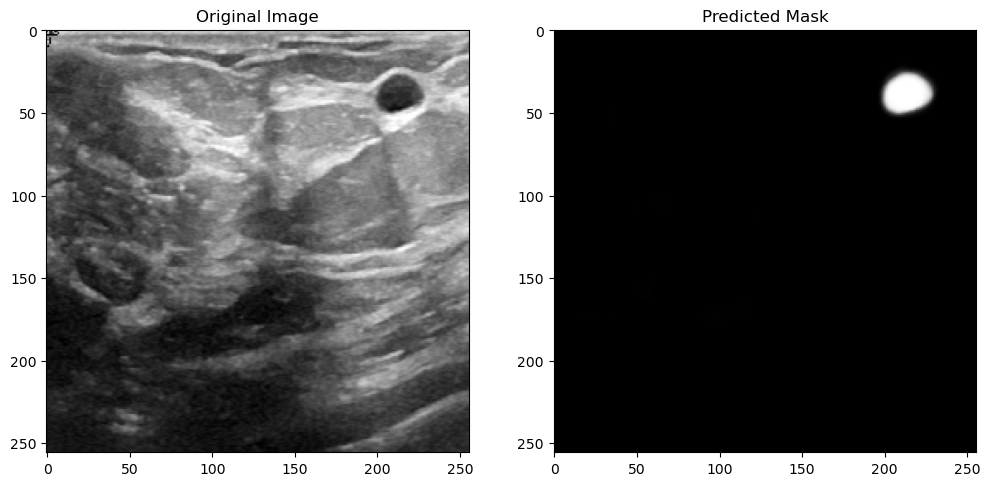

1/1 [==============================] - 0s 52ms/step


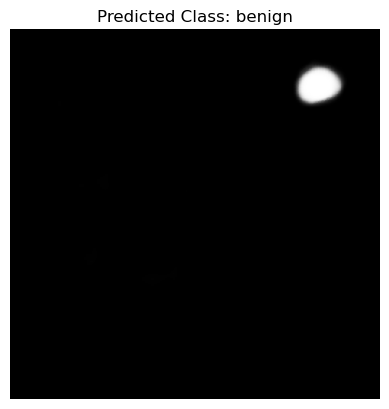

Original File Name: benign (104).png
1/1 [==============================] - 0s 195ms/step


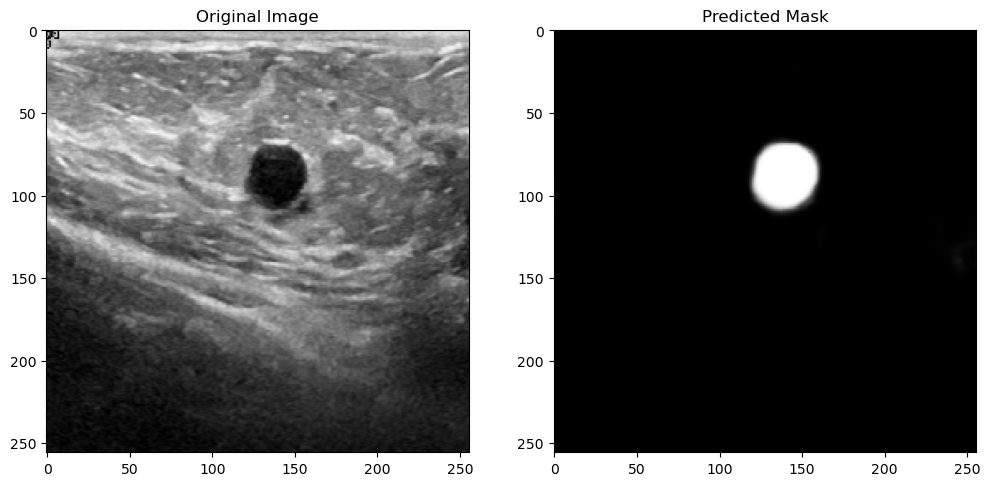

1/1 [==============================] - 0s 49ms/step


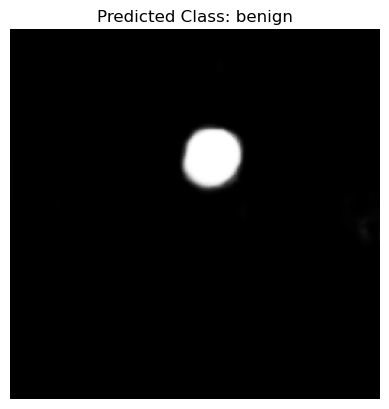

Original File Name: benign (105).png
1/1 [==============================] - 0s 211ms/step


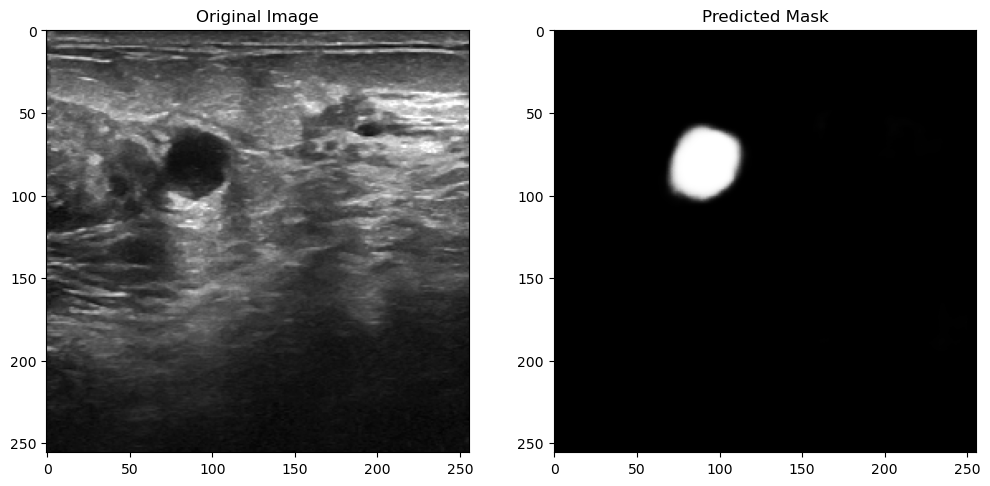

1/1 [==============================] - 0s 25ms/step


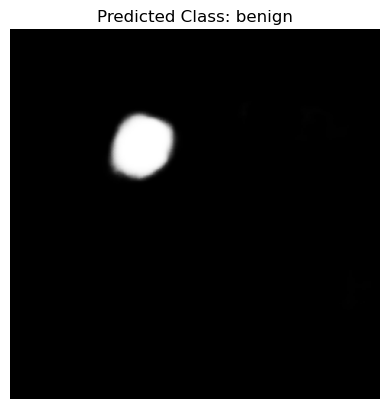

Original File Name: benign (106).png
1/1 [==============================] - 0s 180ms/step


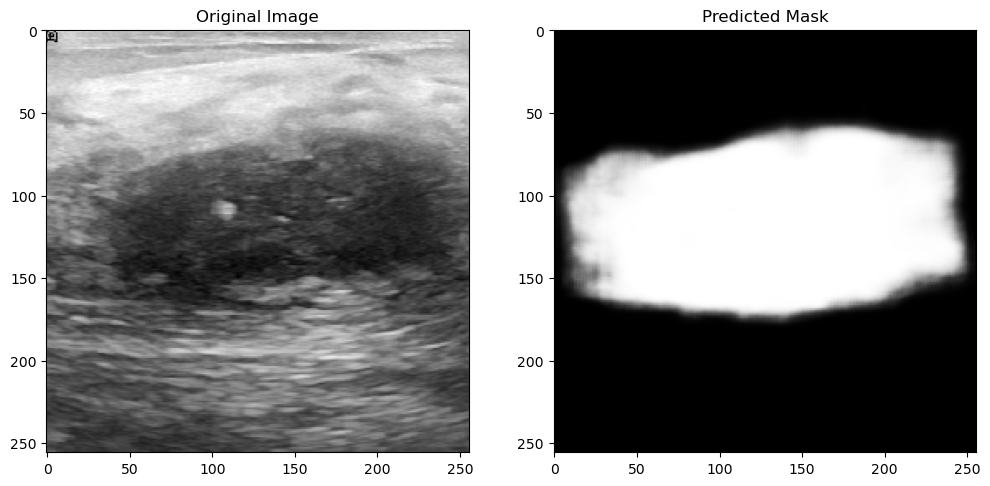

1/1 [==============================] - 0s 39ms/step


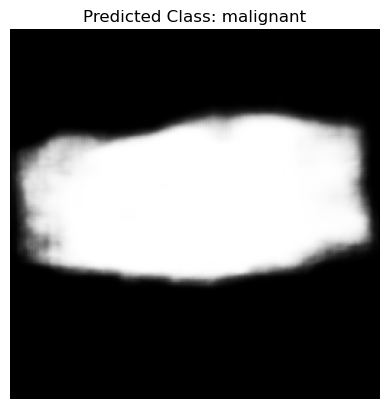

Original File Name: malignant (1).png
1/1 [==============================] - 0s 145ms/step


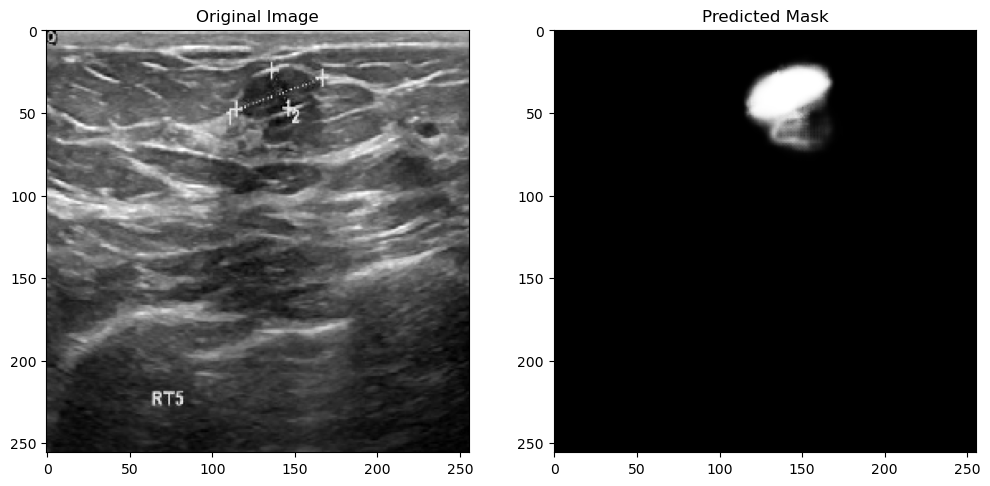

1/1 [==============================] - 0s 49ms/step


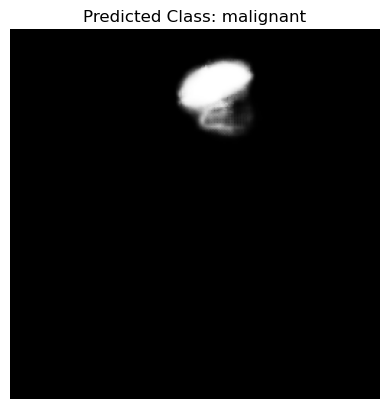

Original File Name: malignant (10).png
1/1 [==============================] - 0s 187ms/step


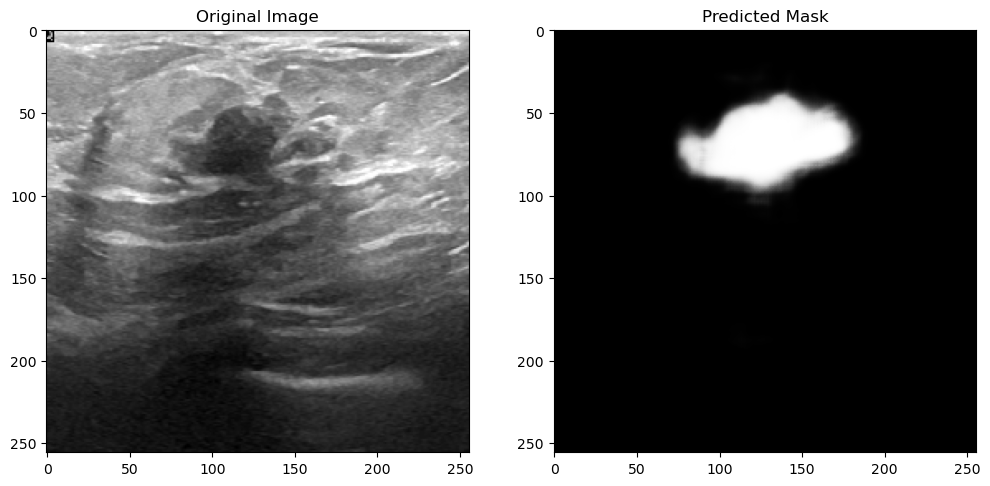

1/1 [==============================] - 0s 52ms/step


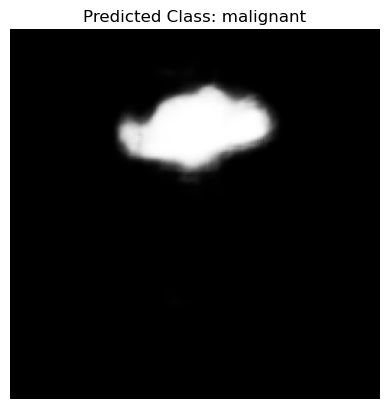

Original File Name: malignant (100).png
1/1 [==============================] - 0s 204ms/step


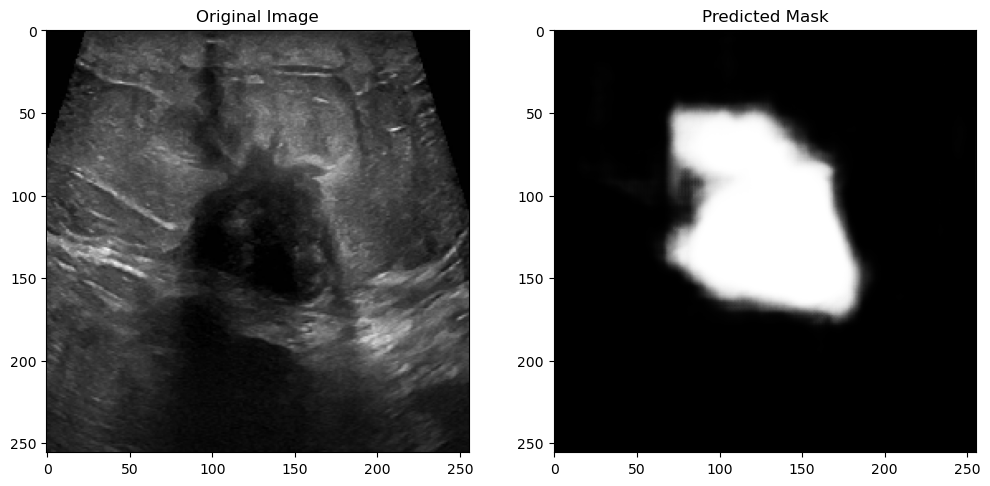

1/1 [==============================] - 0s 27ms/step


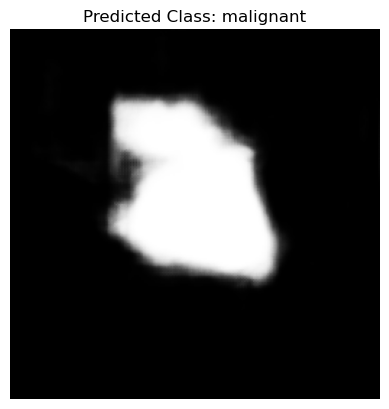

Original File Name: malignant (101).png
1/1 [==============================] - 0s 151ms/step


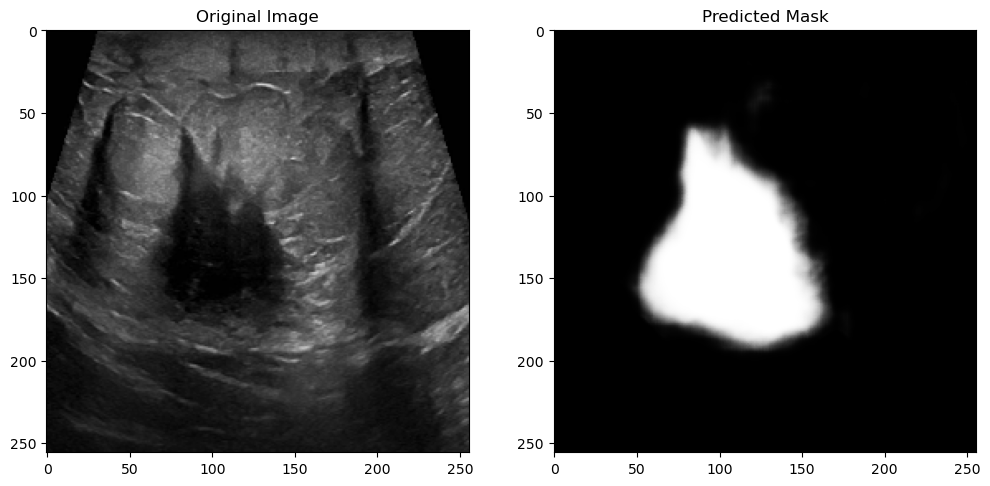

1/1 [==============================] - 0s 27ms/step


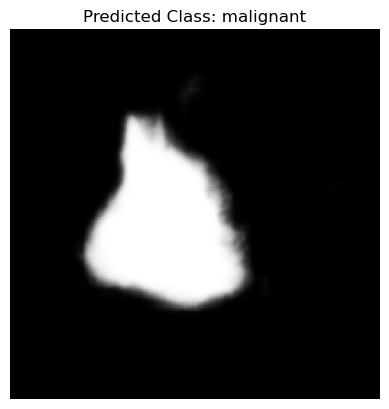

Original File Name: malignant (102).png
1/1 [==============================] - 0s 185ms/step


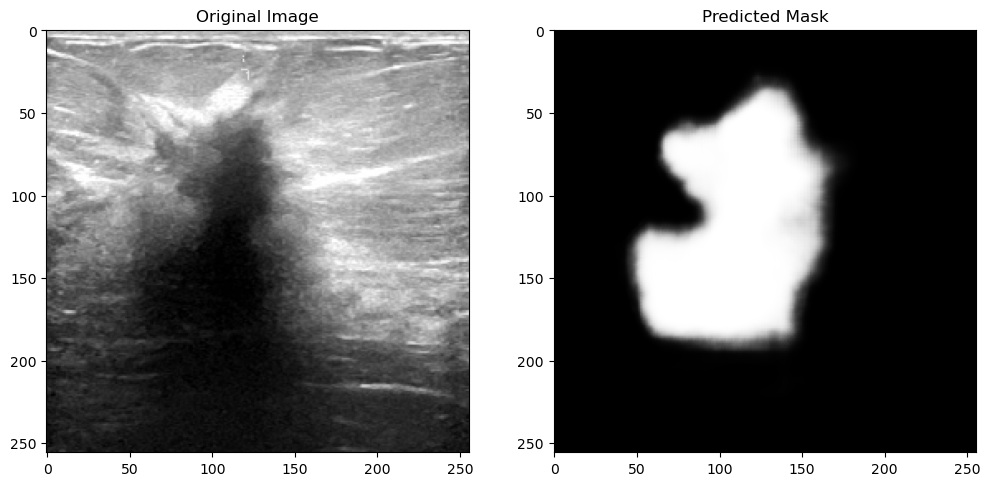

1/1 [==============================] - 0s 24ms/step


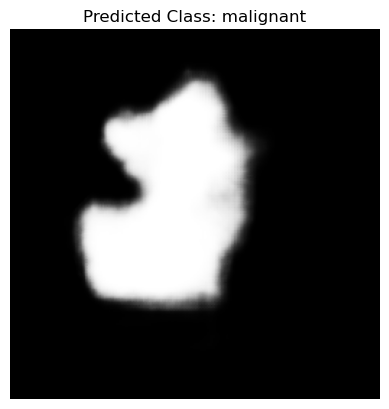

Original File Name: malignant (103).png
1/1 [==============================] - 0s 193ms/step


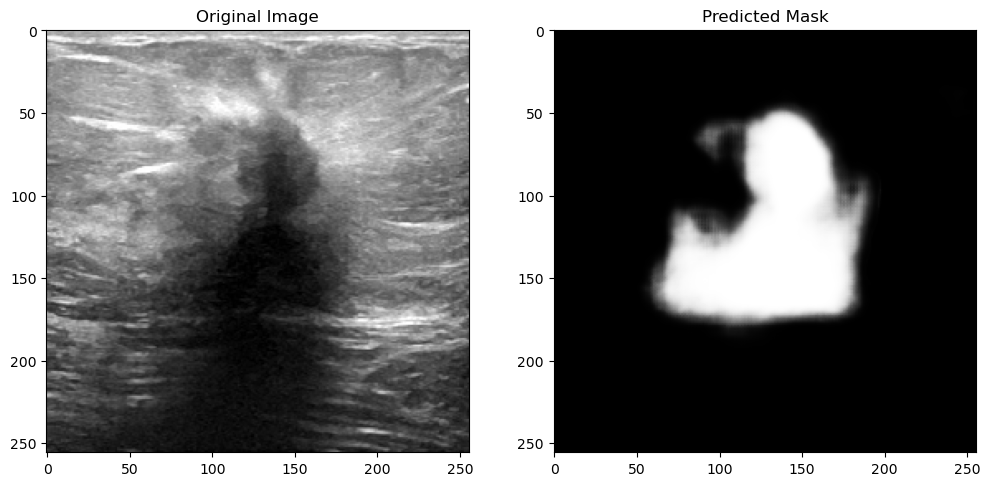

1/1 [==============================] - 0s 31ms/step


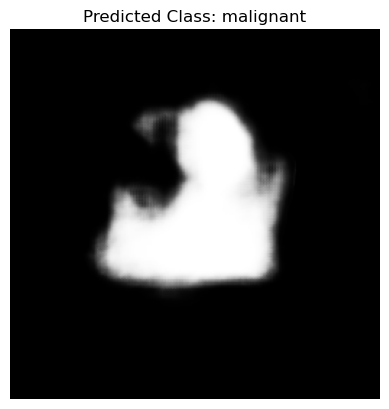

Original File Name: malignant (104).png
1/1 [==============================] - 0s 139ms/step


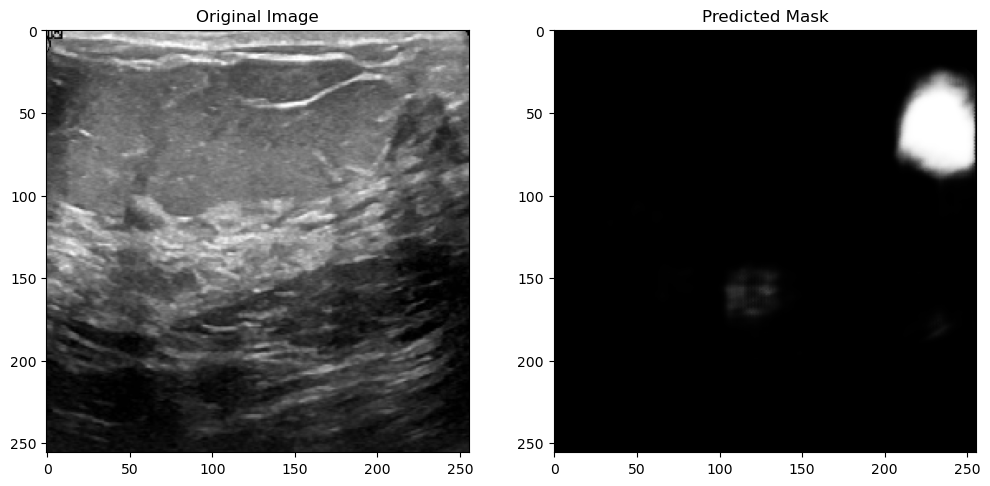

1/1 [==============================] - 0s 49ms/step


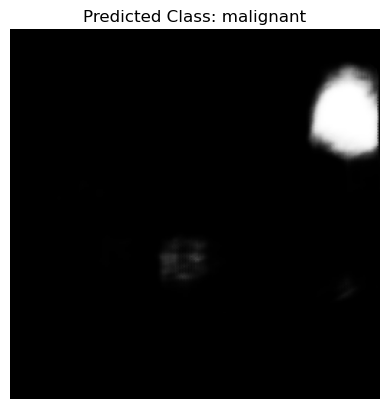

Original File Name: malignant (105).png
1/1 [==============================] - 0s 184ms/step


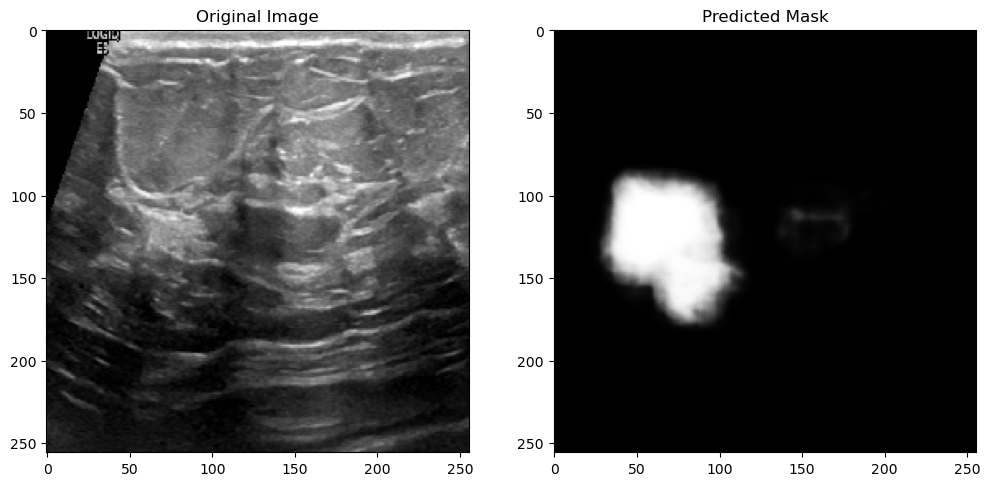

1/1 [==============================] - 0s 31ms/step


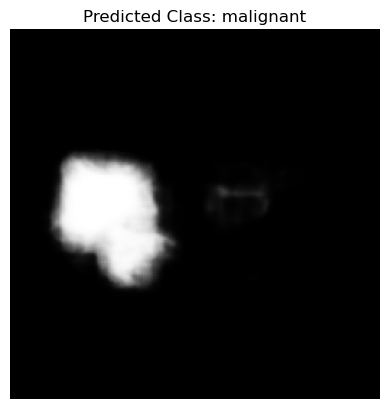

Original File Name: malignant (106).png
1/1 [==============================] - 0s 146ms/step


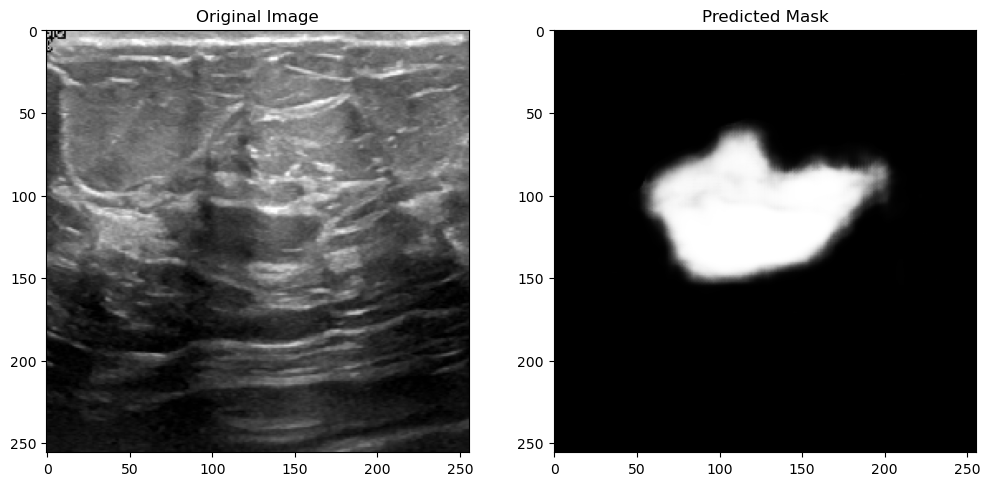

1/1 [==============================] - 0s 25ms/step


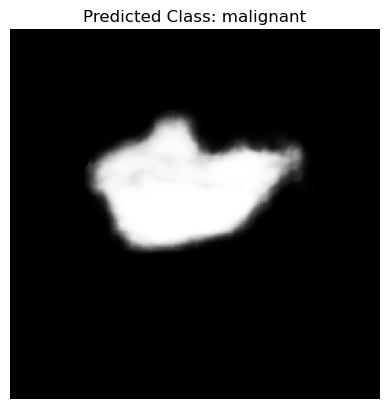

Original File Name: malignant (107).png
1/1 [==============================] - 0s 156ms/step


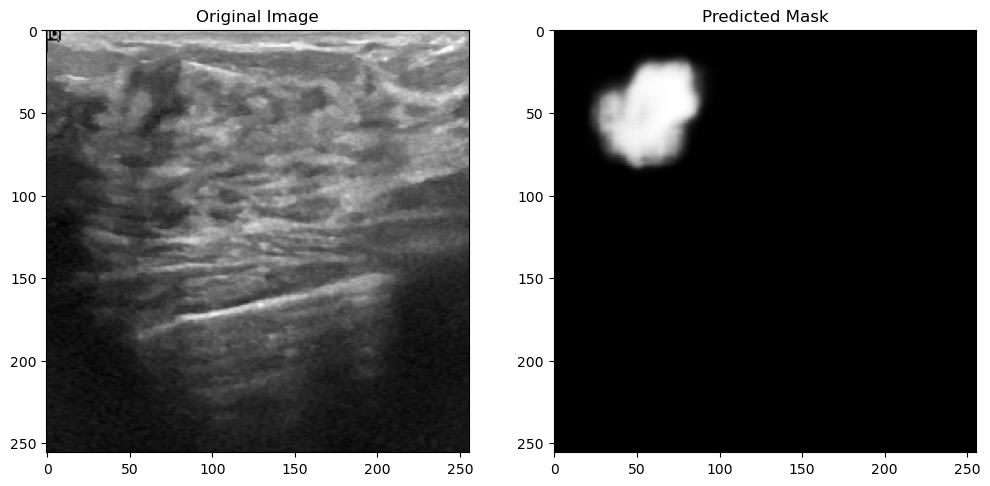

1/1 [==============================] - 0s 34ms/step


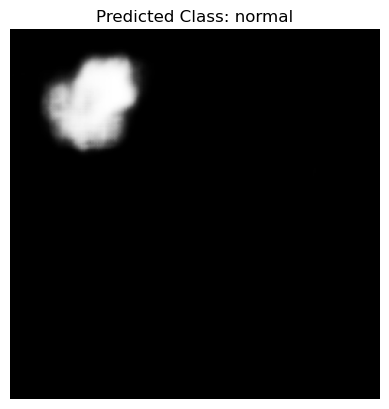

Original File Name: normal (1).png
1/1 [==============================] - 0s 137ms/step


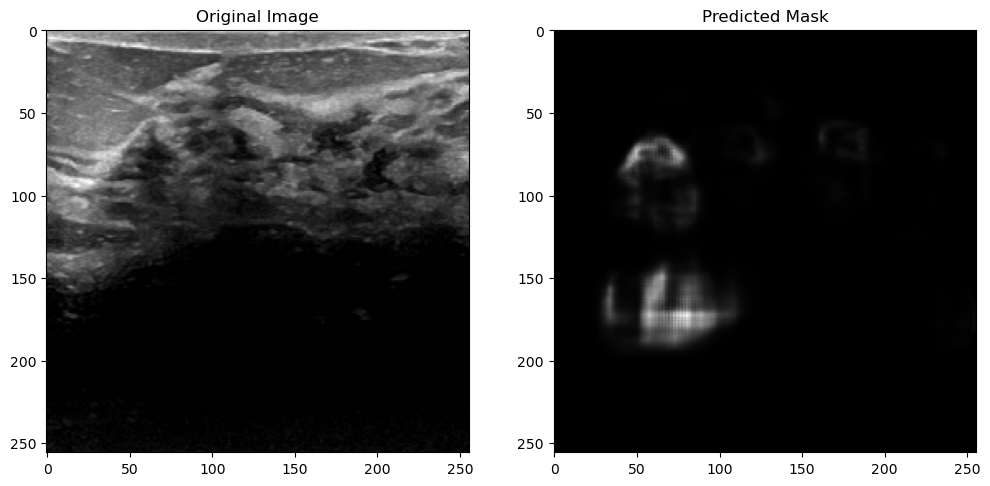

1/1 [==============================] - 0s 36ms/step


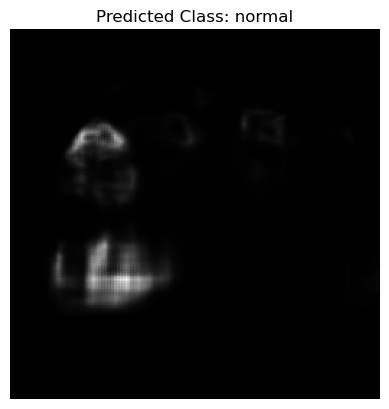

Original File Name: normal (10).png
1/1 [==============================] - 0s 191ms/step


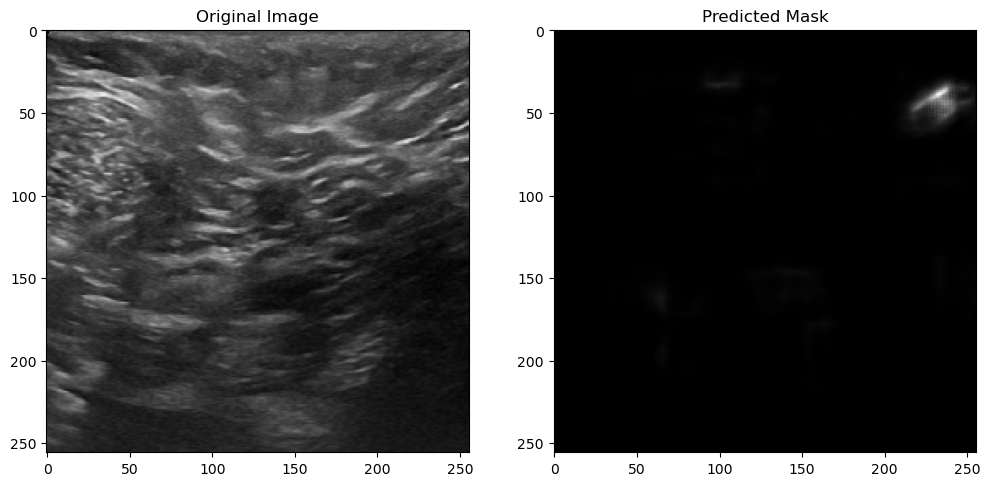

1/1 [==============================] - 0s 35ms/step


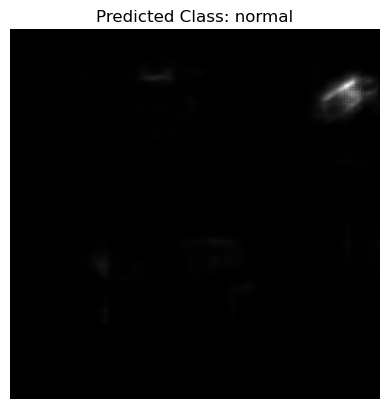

Original File Name: normal (100).png
1/1 [==============================] - 0s 154ms/step


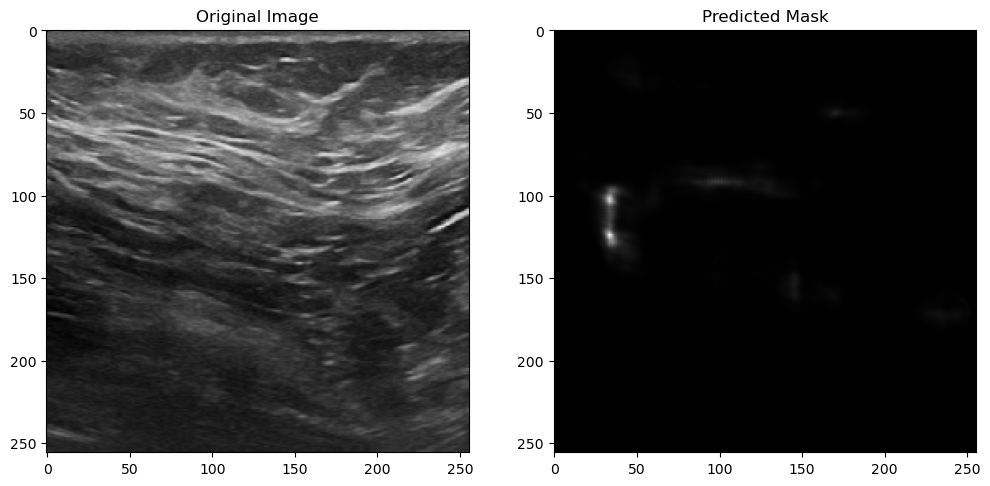

1/1 [==============================] - 0s 27ms/step


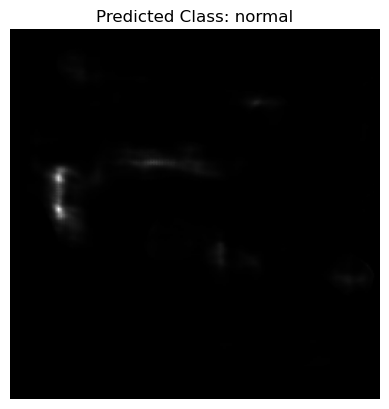

Original File Name: normal (101).png
1/1 [==============================] - 0s 160ms/step


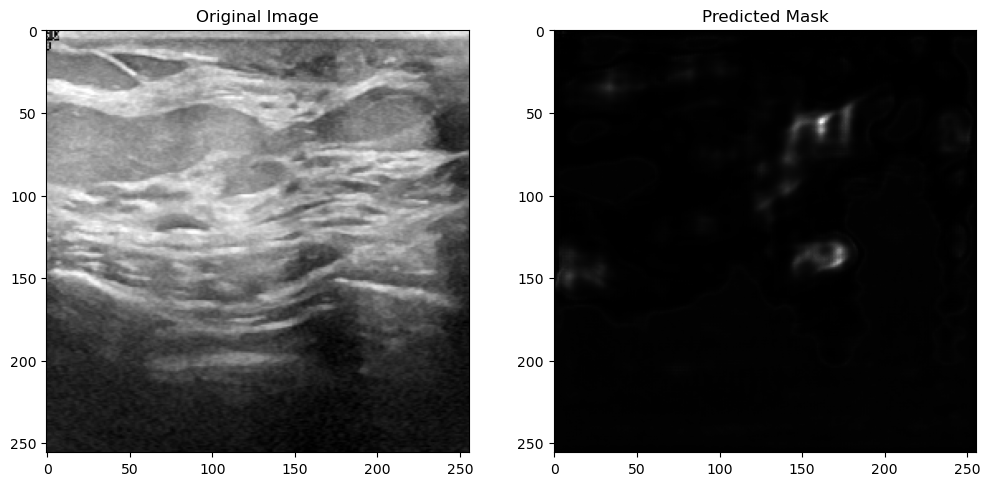

1/1 [==============================] - 0s 23ms/step


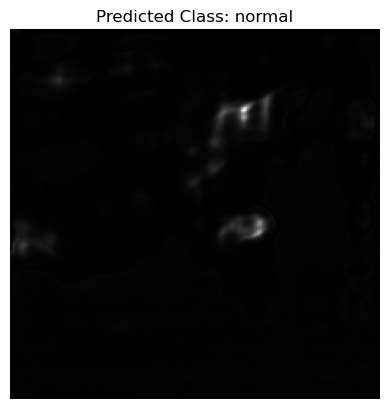

Original File Name: normal (102).png
1/1 [==============================] - 0s 172ms/step


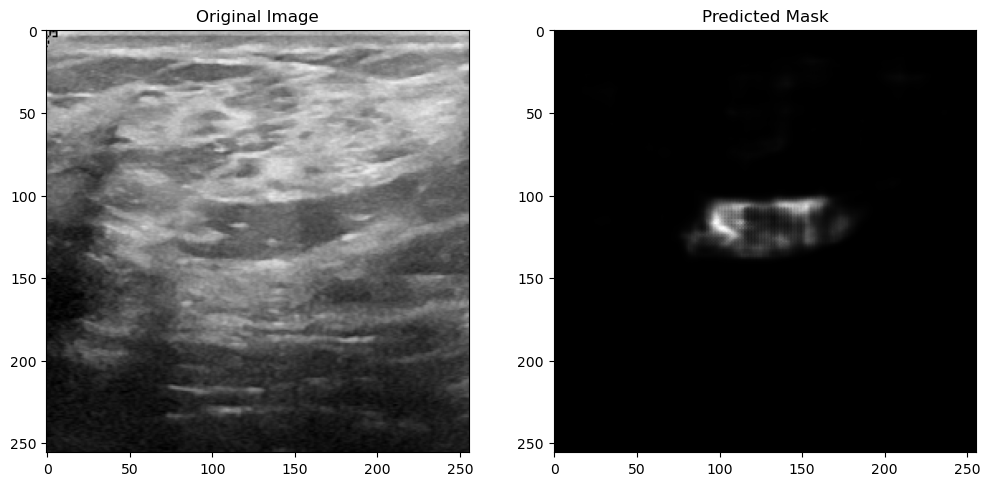

1/1 [==============================] - 0s 48ms/step


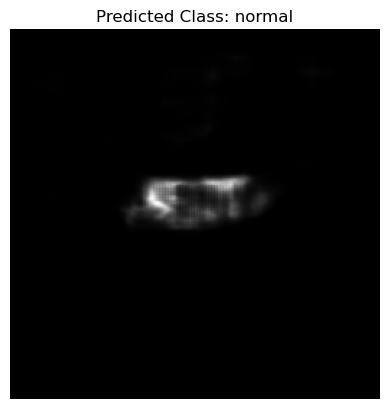

Original File Name: normal (103).png
1/1 [==============================] - 0s 175ms/step


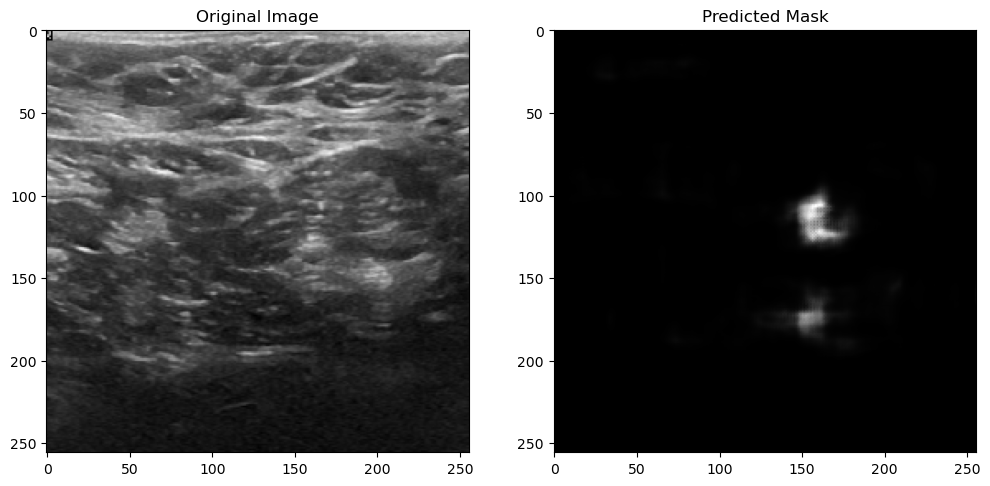

1/1 [==============================] - 0s 47ms/step


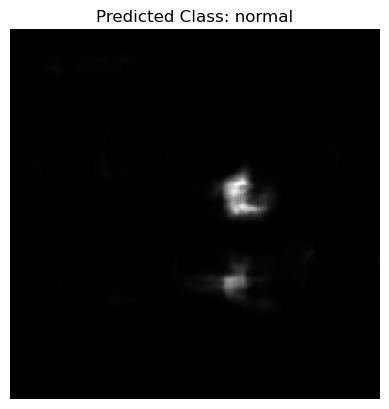

Original File Name: normal (104).png
1/1 [==============================] - 0s 198ms/step


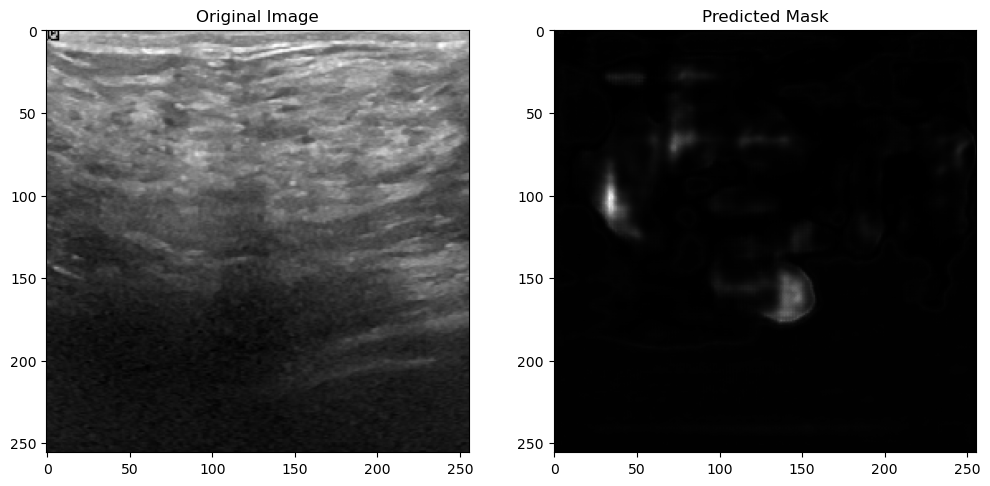

1/1 [==============================] - 0s 21ms/step


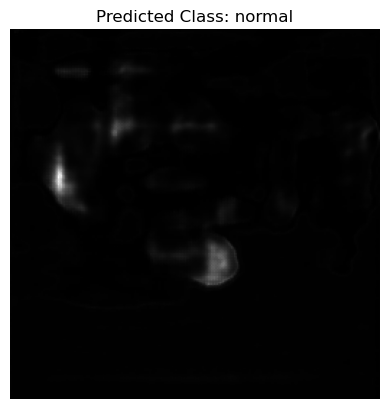

Original File Name: normal (105).png
1/1 [==============================] - 0s 177ms/step


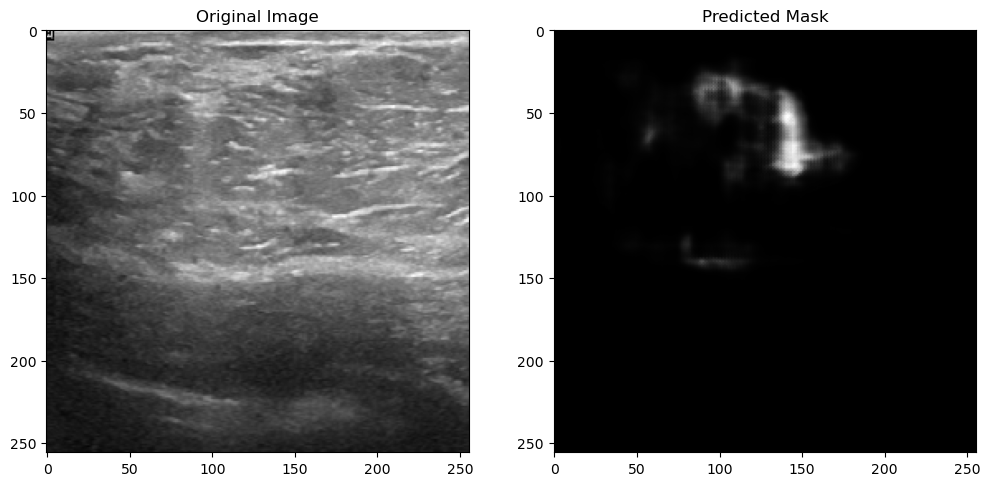

1/1 [==============================] - 0s 51ms/step


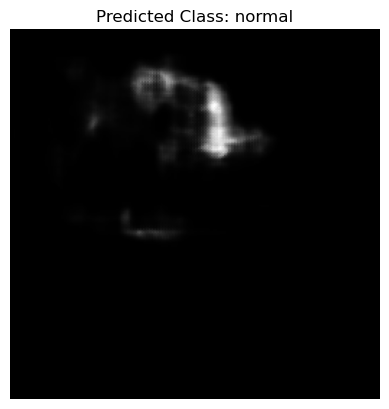

Original File Name: normal (106).png
1/1 [==============================] - 0s 146ms/step


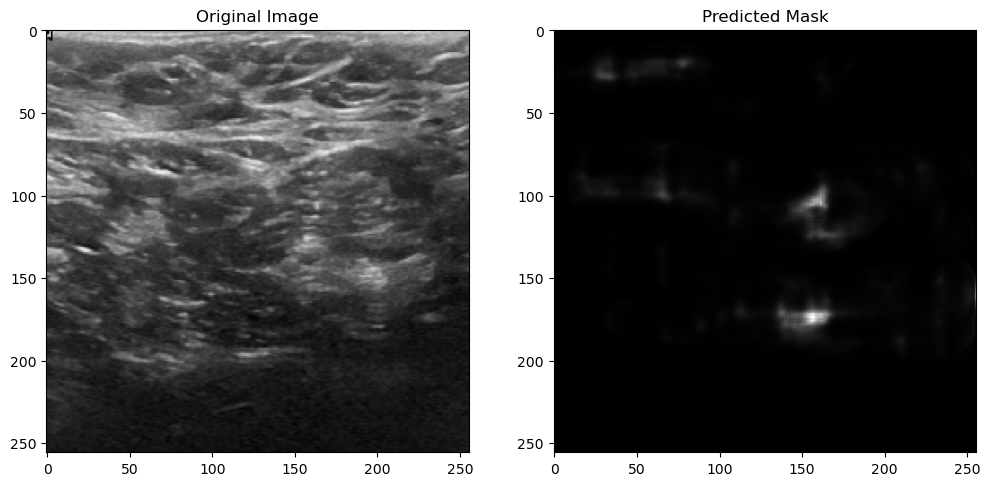

1/1 [==============================] - 0s 51ms/step


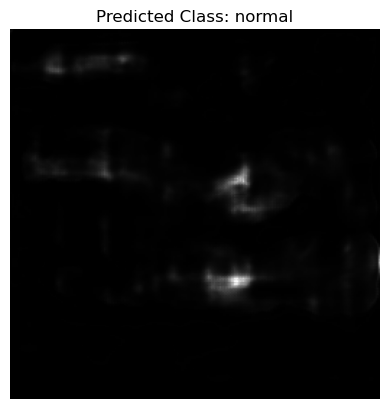

Original File Name: normal (107).png


In [75]:

for image_name in os.listdir(image_folder_path):
    if image_name.endswith('.jpg') or image_name.endswith('.png'):
        image_path = os.path.join(image_folder_path, image_name)

        
        predict_and_visualize_masks(image_path)

        
        img2 = prepare_image(image_path)
        mask_pred = segmentor_model.predict(np.expand_dims(img2, axis=0))[0][:, :, 0]
        temp_mask_path = 'temp_mask.png'  
        plt.imsave(temp_mask_path, mask_pred, cmap='gray')

        
        predict_and_visualize_classification(temp_mask_path)

        
        print(f"Original File Name: {image_name}")

        
        os.remove(temp_mask_path)
